# Fundamental Analysis

In [ ]:
!pip install yahoo_fin

In [ ]:
import yfinance as yf

from yahoo_fin.stock_info import get_analysts_info
import yahoo_fin.stock_info as si
import datetime as dt
import pandas as pd
import numpy as np

from yahoo_fin.stock_info import get_income_statement
from yahoo_fin.stock_info import get_balance_sheet
from yahoo_fin.stock_info import get_cash_flow

In [ ]:
tickers =  ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'BRK-A', 'BRK-B', 'NVDA', 'UNH', 'V',
          'MA', 'JPM', 'JNJ', 'PG', 'DIS', 'BAC', 'PFE', 'MRK', 'ABBV', 'LLY', 'TMO',
          'MDT', 'ABT', 'ASML', 'CRM', 'META', 'PRU', 'MET', 'CB', 'WFC', 'GS',
          'CI', 'TRV', 'AFL', 'DGX', 'HIG']

infos = []

for i in tickers:
    infos.append(yf.Ticker(i).info)

fundamentals = ['pegRatio', 'enterpriseToEbitda', 'debtToEquity', 'beta', 'priceToBook',
                'returnOnEquity', 'returnOnAssets', 'dividendYield', 'revenuePerShare',
                'enterpriseToRevenue', 'trailingPE','forwardPE', 'priceToBook', 'earningsGrowth', 'revenueGrowth']




df = pd.DataFrame(infos)
df = df.set_index('symbol')

df = df[df.columns[df.columns.isin(fundamentals)]]

In [ ]:
# As the fundamentals list contains nan values is the analysis going to use this method


tickers = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'BRK-A', 'BRK-B', 'NVDA', 'UNH', 'V',
           'MA', 'JPM', 'JNJ', 'PG', 'DIS', 'BAC', 'PFE', 'MRK', 'ABBV', 'LLY', 'TMO',
           'MDT', 'ABT', 'ASML', 'CRM', 'META', 'PRU', 'MET', 'CB', 'WFC', 'GS',
           'CI', 'TRV', 'AFL', 'DGX', 'HIG']

infos = []

# Fetching information for each ticker
for i in tickers:
    infos.append(yf.Ticker(i).info)

# Creating DataFrame
df = pd.DataFrame(infos)
df = df.set_index('symbol')

# Selecting only the columns present in the fundamentals list
df = df[fundamentals]

# Calculating mean for each fundamental metric for each ticker
mean_values = df.apply(lambda x: x.mean(), axis=0)

# Printing mean values
print("Mean values for each fundamental metric:")
print(mean_values)

Mean values for each fundamental metric:
pegRatio                   2.055429
enterpriseToEbitda        20.975562
debtToEquity             107.955697
beta                       0.972694
priceToBook               11.859876
returnOnEquity             0.309589
returnOnAssets             0.083194
dividendYield              0.018772
revenuePerShare        14266.664498
enterpriseToRevenue        6.182972
trailingPE                37.401381
forwardPE                 20.017557
priceToBook               11.859876
earningsGrowth             2.579156
revenueGrowth              0.141944
dtype: float64


# Quantitative Finance Project: Estimating a Risk Factor Model for a Stock with Live Data

### 1. Factor Data

In [ ]:
import pandas_datareader
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
# To get different risk factor portfolios
pandas_datareader.famafrench.get_available_datasets()

['F-F_Research_Data_Factors',
 'F-F_Research_Data_Factors_weekly',
 'F-F_Research_Data_Factors_daily',
 'F-F_Research_Data_5_Factors_2x3',
 'F-F_Research_Data_5_Factors_2x3_daily',
 'Portfolios_Formed_on_ME',
 'Portfolios_Formed_on_ME_Wout_Div',
 'Portfolios_Formed_on_ME_Daily',
 'Portfolios_Formed_on_BE-ME',
 'Portfolios_Formed_on_BE-ME_Wout_Div',
 'Portfolios_Formed_on_BE-ME_Daily',
 'Portfolios_Formed_on_OP',
 'Portfolios_Formed_on_OP_Wout_Div',
 'Portfolios_Formed_on_OP_Daily',
 'Portfolios_Formed_on_INV',
 'Portfolios_Formed_on_INV_Wout_Div',
 'Portfolios_Formed_on_INV_Daily',
 '6_Portfolios_2x3',
 '6_Portfolios_2x3_Wout_Div',
 '6_Portfolios_2x3_weekly',
 '6_Portfolios_2x3_daily',
 '25_Portfolios_5x5',
 '25_Portfolios_5x5_Wout_Div',
 '25_Portfolios_5x5_Daily',
 '100_Portfolios_10x10',
 '100_Portfolios_10x10_Wout_Div',
 '100_Portfolios_10x10_Daily',
 '6_Portfolios_ME_OP_2x3',
 '6_Portfolios_ME_OP_2x3_Wout_Div',
 '6_Portfolios_ME_OP_2x3_daily',
 '25_Portfolios_ME_OP_5x5',
 '25_Portf

In [ ]:
# To get factors, we need to determine a stock date (go as far as we can)
start = '2013-01-02'

# To get the Fama-French factors since the date, monthly
ff = pandas_datareader.famafrench.FamaFrenchReader('F-F_Research_Data_Factors',freq='M', start=start).read()

ff_df = ff[0]

# To add the momentum factor
ff_mom_df = pandas_datareader.famafrench.FamaFrenchReader('F-F_Momentum_Factor', freq='M',start=start).read()[0]

# To combine both data frames to make a dataframe with 4 factors (merge by date)
ff_df
ff_mom_df

# Merging them

ffac_merged_df = pd.merge(ff_df,ff_mom_df,on='Date',how='inner',sort=True,copy=True,indicator=False, validate='one_to_one')
ffac_merged_df

<ipython-input-7-d7e20db25145>:5: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  ff = pandas_datareader.famafrench.FamaFrenchReader('F-F_Research_Data_Factors',freq='M', start=start).read()
<ipython-input-7-d7e20db25145>:5: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  ff = pandas_datareader.famafrench.FamaFrenchReader('F-F_Research_Data_Factors',freq='M', start=start).read()
<ipython-input-7-d7e20db25145>:10: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  ff_mom_df = pandas_datareader.famafrench.FamaFrenchReader('F-F_Momentum_Fact

,Mkt-RF,SMB,HML,RF,Mom
Date,,,,,
2013-01,5.57,0.33,0.96,0.00,-1.79
2013-02,1.29,-0.27,0.11,0.00,1.29
2013-03,4.03,0.81,-0.19,0.00,1.92
2013-04,1.55,-2.37,0.45,0.00,0.22
2013-05,2.80,1.70,2.63,0.00,-2.02
...,...,...,...,...,...
2023-12,4.87,6.34,4.93,0.43,-5.51
2024-01,0.70,-5.09,-2.38,0.47,5.11
2024-02,5.06,-0.24,-3.49,0.42,4.99


array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>], dtype=object)

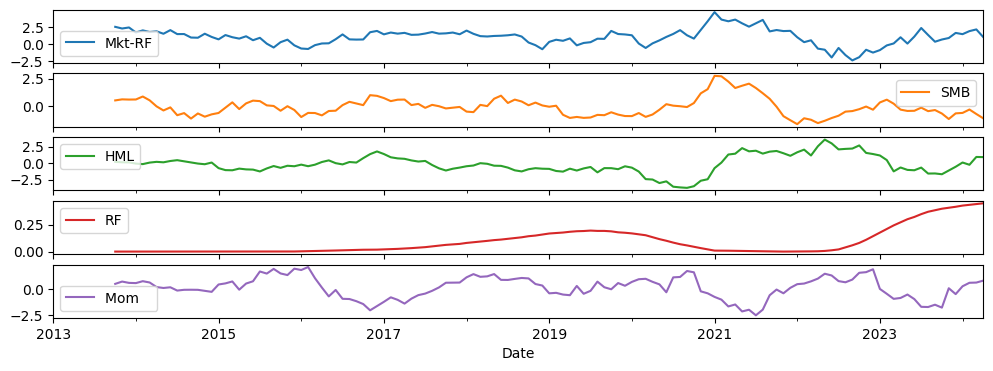

In [ ]:
# To plot the actual returns for each factor

#ffac_merged_df.plot(subplots=True,figsize=(12,4))

ffac_merged_df.rolling(10).mean().plot(subplots=True,figsize=(12,4))

### 2. Risk Asset Data

In [ ]:
# Install Yahoo Finance package to get stock data
!pip install yfinance

In [ ]:
import yfinance as yf

In [ ]:
# Define the list of ticker assets
assets = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'BRK-A', 'BRK-B', 'NVDA', 'UNH', 'V',
          'MA', 'JPM', 'JNJ', 'PG', 'DIS', 'BAC', 'PFE', 'MRK', 'ABBV', 'LLY', 'TMO',
          'MDT', 'ABT', 'ASML', 'CRM', 'META', 'PRU', 'MET', 'CB', 'WFC', 'GS',
          'CI', 'TRV', 'AFL', 'DGX', 'HIG', 'BTC-USD']


start_date = '2013-01-02'
end_date = '2024-04-25'


# Download historical data
asset_data = yf.download(assets, start=start_date, end=end_date)['Adj Close'].resample('M').ffill().pct_change()

# To get it as a dataframe
asset_df = pd.DataFrame(asset_data)

[*********************100%%**********************]  37 of 37 completed


In [ ]:
asset_df

Ticker,AAPL,ABBV,ABT,AFL,AMZN,ASML,BAC,BRK-A,BRK-B,BTC-USD,...,NVDA,PFE,PG,PRU,TMO,TRV,TSLA,UNH,V,WFC
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-02-28,-0.025286,0.006268,-0.002656,-0.051909,-0.004633,-0.054734,-0.007059,0.046101,0.053956,NaN,...,0.038961,0.003299,0.013571,-0.032891,0.023011,0.024981,-0.071448,-0.031878,0.006743,0.007178
2013-03-31,0.002855,0.104551,0.045280,0.041441,0.008401,-0.042125,0.084595,0.024115,0.019969,NaN,...,0.013428,0.054439,0.011552,0.061544,0.038455,0.052823,0.087855,0.074501,0.070600,0.054447
2013-04-30,0.000271,0.139681,0.049259,0.046521,-0.047582,0.104262,0.010674,0.017405,0.020346,NaN,...,0.073266,0.007277,0.003556,0.024241,0.054779,0.014491,0.424914,0.047544,-0.008125,0.026764
2013-05-31,0.022419,-0.072964,-0.006772,0.029484,0.060636,0.092779,0.109666,0.077358,0.072893,NaN,...,0.056173,-0.055487,-0.000130,0.148366,0.094447,-0.019787,0.810706,0.045053,0.059400,0.076074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.120714,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2024-01-31,-0.029218,0.165607,0.090197,0.019707,0.062359,0.272113,0.115448,0.058839,0.065944,0.007510,...,0.315638,-0.097883,0.030044,0.073123,0.087913,0.176617,-0.219885,-0.071404,0.064594,0.125364
2024-02-29,-0.018543,0.070864,0.048520,-0.036616,0.138918,0.096026,0.022145,0.066678,0.066868,0.437169,...,0.285810,-0.019202,0.011455,0.051196,0.057887,0.045420,0.077901,-0.035448,0.036255,0.115593


# Cleaning the Data to Compare Risk

In [ ]:
# Data cleaning

# Changing the index in both dataframe
# Change it into a string to then modify it to date form with year and month
asset_df['str_date'] = asset_df.index.astype(str)
asset_df['dt_date'] = pd.to_datetime(asset_df['str_date']).dt.strftime('%Y-%m')

# Changing the index for the risk factor database
ffac_merged_df['str_date'] = ffac_merged_df.index.astype(str)
ffac_merged_df['dt_date'] = pd.to_datetime(ffac_merged_df['str_date']).dt.strftime('%Y-%m')

# Merging the dataframes
asset_df_ffac_merge_df = pd.merge(asset_df,ffac_merged_df,how='inner',on='dt_date',sort=True,copy=True,indicator=False,validate='one_to_one')
pca_data = asset_df_ffac_merge_df

# Cleaning the table
# Dropping str_date_x and str_date_y
pca_data.drop(columns=['str_date_x','str_date_y'],inplace=True)

# Rename Adj Close
for asset in assets:
    pca_data.rename(columns={'Adj Close': asset}, inplace=True)


# Subtracting the risk-free rate from asset returns to get the risk premia and making all the stock returns in %

assets = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'BRK-A', 'BRK-B', 'NVDA', 'UNH', 'V',
          'MA', 'JPM', 'JNJ', 'PG', 'DIS', 'BAC', 'PFE', 'MRK', 'ABBV', 'LLY', 'TMO',
          'MDT', 'ABT', 'ASML', 'CRM', 'META', 'PRU', 'MET', 'CB', 'WFC', 'GS',
          'CI', 'TRV', 'AFL', 'DGX', 'HIG', 'BTC-USD']


for asset in assets:
    pca_data[f'{asset}_RF'] = pca_data[asset] * 100 - pca_data['RF']


columns_to_drop = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'BRK-A', 'BRK-B', 'NVDA', 'UNH', 'V', 'MA', 'JPM',
                   'JNJ', 'PG', 'DIS', 'BAC', 'PFE', 'MRK', 'ABBV', 'LLY', 'TMO', 'MDT', 'ABT', 'ASML', 'CRM',
                   'META', 'PRU', 'MET', 'CB', 'WFC', 'GS', 'CI', 'TRV', 'AFL', 'DGX', 'HIG','BTC-USD', 'dt_date']

pca_data.drop(columns=columns_to_drop, inplace=True)

# Removing NaN
pca_data.dropna(axis=0,inplace=True)

# Renaming MOM factor
pca_data.rename(columns={'Mom   ':'MOM'}, inplace=True)

In [ ]:
pd.options.display.max_columns = None

# To check columns in the dataframe
#list(pca_data)

pca_data

,Mkt-RF,SMB,HML,RF,MOM,AAPL_RF,MSFT_RF,GOOGL_RF,AMZN_RF,TSLA_RF,BRK-A_RF,BRK-B_RF,NVDA_RF,UNH_RF,V_RF,MA_RF,JPM_RF,JNJ_RF,PG_RF,DIS_RF,BAC_RF,PFE_RF,MRK_RF,ABBV_RF,LLY_RF,TMO_RF,MDT_RF,ABT_RF,ASML_RF,CRM_RF,META_RF,PRU_RF,MET_RF,CB_RF,WFC_RF,GS_RF,CI_RF,TRV_RF,AFL_RF,DGX_RF,HIG_RF,BTC-USD_RF
21,2.52,4.21,-1.81,0.00,-0.06,7.196030,1.272612,-3.490760,-5.266096,-0.403830,1.498308,1.462288,5.907821,10.156537,13.150875,13.465682,1.074836,1.116400,5.014733,2.639539,0.645173,1.285105,-2.260485,10.688025,2.282186,-3.393595,10.568587,5.365663,0.870254,11.228924,-5.123997,0.682307,0.967967,4.224243,2.352003,3.497274,9.791583,7.302510,2.540727,5.153734,6.255047,-12.565897
22,2.55,-2.06,-3.09,0.00,0.69,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.742097
23,-0.06,2.49,2.27,0.00,1.12,2.646874,-0.440959,-6.552552,1.600865,-7.980964,7.619048,7.127561,3.044283,6.800515,8.812074,2.877587,3.472253,-2.346381,4.377252,4.385169,4.558866,4.907428,-1.243857,3.120114,4.766878,6.691986,6.367463,3.280611,8.176158,-7.313640,4.040542,2.878402,0.372106,5.711564,3.941545,2.346928,3.354435,5.561806,2.953911,5.672886,5.790382,-15.303389
24,-3.11,-0.56,-3.58,0.00,3.84,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-32.083459
25,6.13,0.63,-1.86,0.00,-2.82,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.921879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,4.87,6.34,4.93,0.43,-5.51,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,11.641360
132,0.70,-5.09,-2.38,0.47,5.11,-3.391820,4.457293,5.241917,5.765883,-22.458507,5.413862,6.124442,31.093839,-7.610389,5.989398,8.255337,11.930796,2.271483,2.534439,3.492708,11.074769,-10.258279,18.240531,16.090655,8.762891,8.321343,10.887775,8.549679,26.741301,11.117930,18.784170,6.842328,8.472317,6.724089,12.066441,11.964853,14.550012,17.191666,1.500740,-6.388893,10.788950,0.281015
133,5.06,-0.24,-3.49,0.42,4.99,-2.274313,3.811836,-1.590583,13.471751,7.370065,6.247762,6.266820,28.160953,-3.964767,3.205498,5.263058,6.290259,1.911862,0.725485,15.748660,1.794547,-2.340241,4.854052,6.666384,16.523822,5.368714,-5.194963,4.431958,9.182619,9.445176,25.342557,4.699645,0.985439,2.302448,11.139299,1.610414,11.272971,4.122015,-4.081622,-3.176362,9.791588,43.296858
134,2.83,-2.49,4.19,0.43,-0.41,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,-0.430000,16.131329


# Running a Multivariate Regression of Returns of an Asset on a 4-Factor Risk Model

In [ ]:
from statsmodels.api import OLS
import statsmodels.api as sm

# Add a constant, the alpha
pca_data = sm.add_constant(pca_data)

# List of factors

factors = ['Mkt-RF', 'SMB', 'HML', 'MOM', 'const']

# List of excess returns for each asset
assets_rf = ['AAPL_RF', 'MSFT_RF', 'GOOGL_RF', 'AMZN_RF', 'TSLA_RF', 'BRK-A_RF', 'BRK-B_RF', 'NVDA_RF', 'UNH_RF', 'V_RF',
             'MA_RF', 'JPM_RF', 'JNJ_RF', 'PG_RF', 'DIS_RF', 'BAC_RF', 'PFE_RF', 'MRK_RF', 'ABBV_RF', 'LLY_RF',
             'TMO_RF', 'MDT_RF', 'ABT_RF', 'ASML_RF', 'CRM_RF', 'META_RF', 'PRU_RF', 'MET_RF', 'CB_RF', 'WFC_RF',
             'GS_RF', 'CI_RF', 'TRV_RF', 'AFL_RF', 'DGX_RF', 'HIG_RF', 'BTC-USD_RF']

# Results dictionary to store the summary results of each regression
results_dict = {}

# Iterate over each asset's excess returns
for asset_rf in assets_rf:
    # Fit OLS regression for the current asset
    results = OLS(pca_data[asset_rf], pca_data[factors], missing='drop').fit()

    # Store summary results in the dictionary
    results_dict[asset_rf] = results.summary()

# Now you can analyze the results stored in the results_dict dictionary
# For example, you can print the summary results for each asset
for asset_rf, summary in results_dict.items():
    print(f"Summary for {asset_rf}:")
    print(summary)
    print("\n\n")


Summary for AAPL_RF:
                            OLS Regression Results                            
Dep. Variable:                AAPL_RF   R-squared:                       0.226
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     8.052
Date:                Thu, 27 Jun 2024   Prob (F-statistic):           9.88e-06
Time:                        11:07:43   Log-Likelihood:                -391.12
No. Observations:                 115   AIC:                             792.2
Df Residuals:                     110   BIC:                             806.0
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Mkt-RF         0.8637      0.16

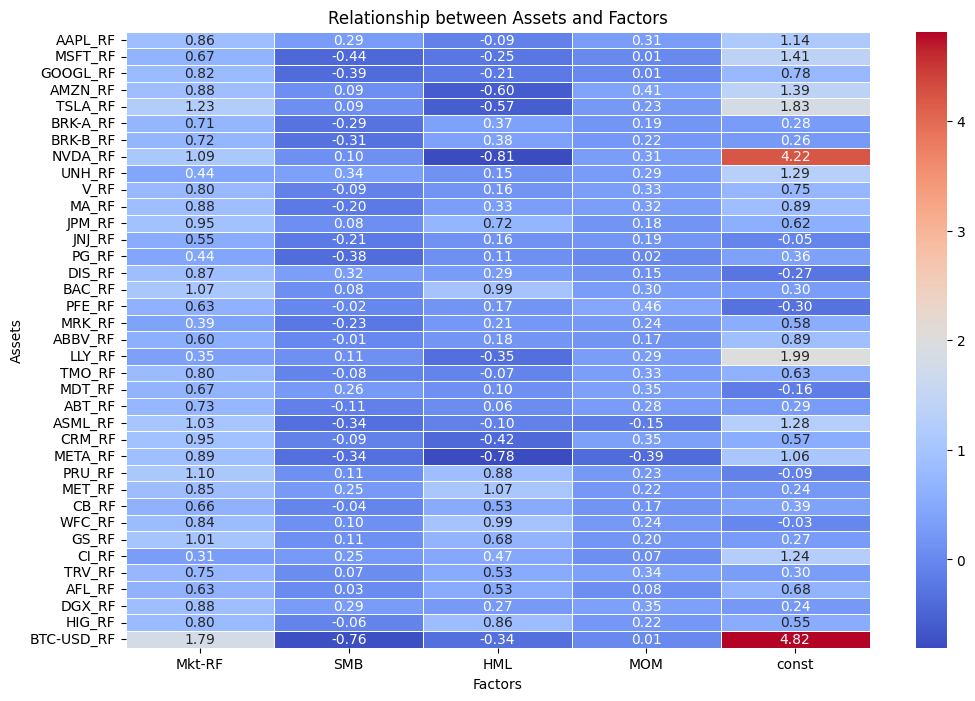

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dataframe to store coefficients or any other measure of relationship
coefficients_df = pd.DataFrame(index=factors, columns=assets_rf)

# Populate the dataframe with coefficients or other measures of relationship
for asset_rf in assets_rf:
    results = OLS(pca_data[asset_rf], pca_data[factors], missing='drop').fit()
    coefficients_df[asset_rf] = results.params


# Transpose the coefficients dataframe
coefficients_df_transposed = coefficients_df.T

# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(coefficients_df_transposed, cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5)
plt.title('Relationship between Assets and Factors')
plt.xlabel('Factors')
plt.ylabel('Assets')
plt.show()


In [ ]:
#Risk Contribution per asset

# Initialize dictionary to store factor loadings for each asset
asset_factor_loadings = {}

#Data collection

Y = pca_data[['AAPL_RF', 'MSFT_RF', 'GOOGL_RF', 'AMZN_RF', 'TSLA_RF', 'BRK-A_RF', 'BRK-B_RF', 'NVDA_RF', 'UNH_RF', 'V_RF', 'MA_RF', 'JPM_RF', 'JNJ_RF', 'PG_RF',
                        'DIS_RF', 'BAC_RF', 'PFE_RF', 'MRK_RF', 'ABBV_RF', 'LLY_RF', 'TMO_RF', 'MDT_RF', 'ABT_RF', 'ASML_RF', 'CRM_RF', 'META_RF', 'PRU_RF', 'MET_RF',
                        'CB_RF', 'WFC_RF', 'GS_RF', 'CI_RF', 'TRV_RF', 'AFL_RF', 'DGX_RF', 'HIG_RF', 'BTC-USD_RF']]

X = sm.add_constant(pca_data[['Mkt-RF', 'SMB', 'HML', 'MOM']])


# Loop over the columns in Y, which are the asset names
for asset in Y.columns:
    # Fit OLS regression model for the current asset
    model = sm.OLS(Y[asset], X)
    results = model.fit()

    # Get factor loadings (regression coefficients) for the current asset
    factor_loadings = results.params

    # Store factor loadings in the dictionary
    asset_factor_loadings[asset] = factor_loadings

# Print factor loadings for each asset
for asset, loadings in asset_factor_loadings.items():
    print(f"Asset: {asset}")
    print("**Factor Loadings:**")
    print(loadings)
    print("\n")


Asset: AAPL_RF
**Factor Loadings:**
const     1.138456
Mkt-RF    0.863743
SMB       0.287949
HML      -0.086537
MOM       0.313406
dtype: float64


Asset: MSFT_RF
**Factor Loadings:**
const     1.405053
Mkt-RF    0.674542
SMB      -0.437594
HML      -0.246109
MOM       0.009646
dtype: float64


Asset: GOOGL_RF
**Factor Loadings:**
const     0.781589
Mkt-RF    0.819244
SMB      -0.389771
HML      -0.208391
MOM       0.013244
dtype: float64


Asset: AMZN_RF
**Factor Loadings:**
const     1.388765
Mkt-RF    0.875230
SMB       0.091163
HML      -0.600702
MOM       0.414126
dtype: float64


Asset: TSLA_RF
**Factor Loadings:**
const     1.833574
Mkt-RF    1.227250
SMB       0.085897
HML      -0.573398
MOM       0.233760
dtype: float64


Asset: BRK-A_RF
**Factor Loadings:**
const     0.280465
Mkt-RF    0.712553
SMB      -0.292613
HML       0.369744
MOM       0.190304
dtype: float64


Asset: BRK-B_RF
**Factor Loadings:**
const     0.261459
Mkt-RF    0.716747
SMB      -0.308402
HML       0.3777

In [ ]:
#Risk Contribution data frame

factor_loadings_df = pd.DataFrame(asset_factor_loadings)
factor_loadings_df = factor_loadings_df.T

risk_contribution = factor_loadings_df

print(risk_contribution)

               const    Mkt-RF       SMB       HML       MOM
AAPL_RF     1.138456  0.863743  0.287949 -0.086537  0.313406
MSFT_RF     1.405053  0.674542 -0.437594 -0.246109  0.009646
GOOGL_RF    0.781589  0.819244 -0.389771 -0.208391  0.013244
AMZN_RF     1.388765  0.875230  0.091163 -0.600702  0.414126
TSLA_RF     1.833574  1.227250  0.085897 -0.573398  0.233760
BRK-A_RF    0.280465  0.712553 -0.292613  0.369744  0.190304
BRK-B_RF    0.261459  0.716747 -0.308402  0.377777  0.221673
NVDA_RF     4.220371  1.087898  0.098847 -0.805187  0.307428
UNH_RF      1.286549  0.439140  0.339010  0.154231  0.286453
V_RF        0.749439  0.795123 -0.088753  0.161140  0.325409
MA_RF       0.885215  0.884137 -0.203587  0.325007  0.321823
JPM_RF      0.618403  0.946085  0.077397  0.722655  0.179286
JNJ_RF     -0.050846  0.552002 -0.210113  0.160632  0.186396
PG_RF       0.361391  0.442915 -0.377489  0.111283  0.018907
DIS_RF     -0.274443  0.872560  0.315468  0.290526  0.154826
BAC_RF      0.304957  1.

# Portfolio Optimization

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

# Load your pca_data and prepare asset and factor data
asset_data = pca_data[['AAPL_RF', 'MSFT_RF', 'GOOGL_RF', 'AMZN_RF', 'TSLA_RF', 'BRK-A_RF', 'BRK-B_RF', 'NVDA_RF', 'UNH_RF', 'V_RF', 'MA_RF', 'JPM_RF', 'JNJ_RF', 'PG_RF',
                        'DIS_RF', 'BAC_RF', 'PFE_RF', 'MRK_RF', 'ABBV_RF', 'LLY_RF', 'TMO_RF', 'MDT_RF', 'ABT_RF', 'ASML_RF', 'CRM_RF', 'META_RF', 'PRU_RF', 'MET_RF',
                        'CB_RF', 'WFC_RF', 'GS_RF', 'CI_RF', 'TRV_RF', 'AFL_RF', 'DGX_RF', 'HIG_RF', 'BTC-USD_RF']]

factor_data = pca_data[['Mkt-RF', 'SMB', 'HML', 'MOM']]

# Initialize components for the Monte Carlo simulation
num_of_portfolios = 10000
num_assets = len(asset_data.columns)
num_factors = len(factor_data.columns)

# Prepare arrays to store weights, returns, max drawdown, and Calmar ratio
asset_weights_all = np.zeros((num_of_portfolios, num_assets))
factor_weights_all = np.zeros((num_of_portfolios, num_factors))
maxdd_ret_arr = np.zeros(num_of_portfolios)
max_dd_arr = np.zeros(num_of_portfolios)
calmar_ratio_arr = np.zeros(num_of_portfolios)

# Start the simulations
for ind in range(num_of_portfolios):
    # Generate random weights for assets
    asset_weights = np.random.random(num_assets)
    asset_weights /= np.sum(asset_weights)

    # Generate random weights for factors
    factor_weights = np.random.random(num_factors)
    factor_weights /= np.sum(factor_weights)

    # Combine asset returns and factor loadings to calculate portfolio return
    combined_returns = asset_data.dot(asset_weights) + factor_data.dot(factor_weights)

    # Calculate portfolio return
    maxdd_portfolio_return = np.mean(combined_returns) * 12  # Convert monthly returns to annual returns
    maxdd_ret_arr[ind] = maxdd_portfolio_return

    # Calculate the Max Drawdown
    maxdd_portfolio_returns_cumulative = (1 + combined_returns / 100).cumprod()  # Convert percentage returns to decimal
    running_max = np.maximum.accumulate(maxdd_portfolio_returns_cumulative)
    drawdown = (maxdd_portfolio_returns_cumulative) / running_max - 1.0
    max_dd_arr[ind] = drawdown.min() * 100  # Convert max drawdown to percentage

    # Save weights
    asset_weights_all[ind, :] = asset_weights
    factor_weights_all[ind, :] = factor_weights

    # Calculate Calmar Ratio assuming zero risk-free rate
    calmar_ratio_arr[ind] = maxdd_portfolio_return / np.abs(max_dd_arr[ind])

# Create DataFrame for Monte Carlo simulation results
maxdd_df = pd.DataFrame({
    'Returns': maxdd_ret_arr,
    'Max Drawdown': max_dd_arr,
    'Calmar Ratio': calmar_ratio_arr,
    'Asset Weights': [weights for weights in asset_weights_all],
    'Factor Weights': [weights for weights in factor_weights_all]
})

print(maxdd_df)




        Returns  Max Drawdown  Calmar Ratio  \
0     22.475747    -26.470662      0.849081   
1     18.773544    -27.183559      0.690621   
2     19.999627    -32.919207      0.607537   
3     23.704852    -29.957741      0.791276   
4     21.154346    -26.972612      0.784290   
...         ...           ...           ...   
9995  23.092028    -19.898697      1.160479   
9996  24.512061    -32.563714      0.752742   
9997  24.195400    -25.286113      0.956865   
9998  23.159699    -30.155688      0.768004   
9999  20.625969    -30.923859      0.666992   

                                          Asset Weights  \
0     [0.011453148675932301, 0.04945853779492474, 0....   
1     [0.013940884154102776, 0.0035718975599049784, ...   
2     [0.037819197621026215, 0.02352886925428045, 0....   
3     [0.0461692191048845, 0.02714080579421141, 0.01...   
4     [0.02021789465704697, 0.020237374436078363, 0....   
...                                                 ...   
9995  [0.0001186965534

In [ ]:
# Max Calmar Ratio
calmar_ratio = maxdd_df.loc[maxdd_df['Calmar Ratio'].idxmax()]

pd.set_option('display.max_colwidth', None)

# Retrieve individual columns
returns_calmar = calmar_ratio['Returns']
max_drawdown_calmar = calmar_ratio['Max Drawdown']
calmar_ratio_val = calmar_ratio['Calmar Ratio']

print("Returns:", returns_calmar)
print("Max Drawdown:", max_drawdown_calmar)
print("Calmar Ratio:", calmar_ratio_val)


Returns: 21.705274719773044
Max Drawdown: -14.95852295307194
Calmar Ratio: 1.451030612304911


In [ ]:
# Weights
portfolio_weights_calmar = calmar_ratio['Asset Weights']
portfolio_weights_calmar = '[' + ', '.join(map(str, portfolio_weights_calmar)) + ']'
print("Portfolio Weights:", portfolio_weights_calmar)


Portfolio Weights: [0.05048446579930758, 0.004077304463739128, 0.0025824566222247586, 0.006175123905645815, 0.06011498039527989, 0.017914974315743286, 0.029750908494805082, 0.013663482766979889, 0.03964140805625464, 0.03159064111917487, 0.03225216655463277, 0.041464689415659894, 0.02039596094593199, 0.03117181684337229, 0.023332317175448293, 0.045159043127136186, 0.03383132508321953, 0.05488149446250205, 0.02664049336316842, 0.05569158389268788, 0.03578941778517288, 0.026035761966945303, 0.059154462142272234, 0.034390595205284584, 0.023142274141709735, 0.006262161907248204, 0.0074259599454708745, 0.003425019398337683, 0.029562158997209802, 0.023521215929185227, 0.005124466937999856, 0.001091630815042817, 0.04505972274980962, 0.0038145537951354723, 0.033825664268822414, 0.008322180803249507, 0.033236116408189506]


In [ ]:
# Factor Weights
factor_weights_calmar = calmar_ratio['Factor Weights']
pd.set_option('display.max_colwidth', None)
print("Risk Contribution:", factor_weights_calmar)

Risk Contribution: [0.06320042 0.10165188 0.02227095 0.81287675]


In [ ]:
# Define assets and weights
risk_factors = ['Mkt-RF', 'SMB', 'HML', 'MOM']
weighted_factors = factor_weights_calmar

# Create a DataFrame
risk_contribution = pd.DataFrame({'Risk Factor': risk_factors, 'Weighted Factors': weighted_factors})

# Print the DataFrame
print(risk_contribution)

  Risk Factor  Weighted Factors
0      Mkt-RF          0.063200
1         SMB          0.101652
2         HML          0.022271
3         MOM          0.812877


# Backtesting with VectorBT

In [ ]:
!wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
!tar -xzvf ta-lib-0.4.0-src.tar.gz
%cd ta-lib
!./configure --prefix=/usr
!make
!make install
!pip install TA-Lib

--2024-06-27 11:08:18--  http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
Resolving prdownloads.sourceforge.net (prdownloads.sourceforge.net)... 204.68.111.105
Connecting to prdownloads.sourceforge.net (prdownloads.sourceforge.net)|204.68.111.105|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2024-06-27 11:08:18--  http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 204.68.111.105
Reusing existing connection to prdownloads.sourceforge.net:80.
HTTP request sent, awaiting response... 302 Found
Location: http://pilotfiber.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz?viasf=1 [following]
--2024-06-27 11:08:18--  http://pilotfiber.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz?viasf=1
Res

In [ ]:
!pip install -U "vectorbt[full]"

In [ ]:
import os
import numpy as np
import pandas as pd
import yfinance as yf
from datetime import datetime
import pytz
from numba import njit

import vectorbt as vbt
from vectorbt.generic.nb import nanmean_nb
from vectorbt.portfolio.nb import order_nb, sort_call_seq_nb
from vectorbt.portfolio.enums import SizeType, Direction

vbt.settings.array_wrapper['freq'] = 'days'
vbt.settings.returns['year_freq'] = '252 days'
vbt.settings.portfolio['seed'] = 42
vbt.settings.portfolio.stats['incl_unrealized'] = True

In [ ]:
#Backtesting data

symbols = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'BRK-A', 'BRK-B', 'NVDA', 'UNH', 'V',
          'MA', 'JPM', 'JNJ', 'PG', 'DIS', 'BAC', 'PFE', 'MRK', 'ABBV', 'LLY', 'TMO',
          'MDT', 'ABT', 'ASML', 'CRM', 'META', 'PRU', 'MET', 'CB', 'WFC', 'GS',
          'CI', 'TRV', 'AFL', 'DGX', 'HIG', 'BTC']


start_date = '2013-01-02'  # define start date
end_date = datetime.today().strftime('%Y-%m-%d')  # format the current date as a string in 'YYYY-MM-DD' format


# Download historical data
price= yf.download(symbols, start=start_date, end=end_date)['Adj Close']

[*********************100%%**********************]  37 of 37 completed


In [ ]:
price

Ticker,AAPL,ABBV,ABT,AFL,AMZN,ASML,BAC,BRK-A,BRK-B,BTC,CB,CI,CRM,DGX,DIS,GOOGL,GS,HIG,JNJ,JPM,LLY,MA,MDT,MET,META,MRK,MSFT,NVDA,PFE,PG,PRU,TMO,TRV,TSLA,UNH,V,WFC
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-02,16.725037,22.002176,25.748272,20.467270,12.865500,59.565228,9.784617,139610.0,93.199997,NaN,64.427528,51.773003,42.736675,46.352364,46.303741,18.078600,106.419861,18.617508,51.558193,32.691418,38.293221,47.666306,32.405090,21.541845,27.942581,27.599781,22.492279,0.293560,15.956170,49.835758,35.572136,62.445572,55.961868,2.357333,45.698944,35.808285,25.187162
2013-01-03,16.513931,21.820499,26.728386,19.948683,12.924000,58.316467,9.727684,140549.0,93.620003,NaN,64.766273,51.012753,42.122478,46.123196,46.403400,18.089098,105.837875,18.978710,51.485424,32.625542,38.455635,47.734505,32.861607,21.511202,27.713053,28.260723,22.190971,0.293791,15.919221,49.519741,35.337204,62.253441,56.391968,2.318000,43.562309,35.835934,24.978771
2013-01-04,16.053940,21.544844,26.567711,19.698845,12.957500,57.718849,9.849687,140803.0,93.849998,NaN,64.845039,51.388176,42.347183,45.830826,47.291428,18.446547,108.723442,19.253536,52.074959,33.203819,39.878777,47.732632,33.008625,22.032133,28.701021,28.020386,21.775658,0.303484,15.986962,49.620285,35.889641,62.801037,56.883537,2.293333,43.646099,36.128616,25.108124
2013-01-07,15.959508,21.588699,26.784630,19.623144,13.423000,56.782288,9.833418,140190.0,93.449997,NaN,64.057335,51.566521,42.189888,45.664883,46.185944,18.366058,108.521393,19.010124,51.965771,33.240414,39.824623,48.559837,33.395508,21.934074,29.359669,28.120525,21.734938,0.294714,15.999278,49.282722,35.426094,63.290977,56.115479,2.289333,43.646099,36.386723,24.985962
2013-01-08,16.002457,21.118828,26.792667,19.850252,13.319000,56.318462,9.743951,141000.0,93.809998,NaN,63.009659,51.078445,42.437065,45.577969,45.995647,18.329815,107.543373,18.727446,51.973038,33.306305,40.126286,48.399994,33.356812,22.062775,29.000406,28.160587,21.620926,0.288252,16.023912,49.203739,35.343548,62.897106,56.215321,2.245333,43.067947,36.725506,24.942833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-20,209.679993,172.130005,106.570000,89.760002,186.100006,1050.739990,39.990002,617250.0,409.149994,92.331398,266.480011,337.880005,241.800003,138.199997,101.839996,176.300003,458.049988,103.690002,147.779999,198.669998,885.989990,452.510010,80.169998,70.849998,501.700012,129.669998,445.700012,130.779999,27.740000,167.669998,117.040001,557.210022,211.970001,181.570007,484.519989,276.820007,58.959999
2024-06-21,207.490005,170.389999,105.720001,89.669998,189.080002,1036.599976,39.490002,615001.0,409.619995,92.319801,264.600006,339.980011,245.059998,138.960007,102.269997,179.630005,450.179993,102.940002,148.750000,196.300003,883.880005,454.850006,81.639999,71.269997,494.779999,130.720001,449.779999,126.570000,27.740000,168.259995,117.730003,564.599976,209.800003,183.009995,482.589996,275.220001,58.099998
2024-06-24,208.139999,172.740005,105.300003,90.430000,185.570007,1002.010010,40.020000,624082.0,413.980011,92.364098,266.119995,343.140015,239.940002,140.229996,101.980003,179.220001,462.089996,104.419998,149.119995,198.880005,890.109985,456.959991,81.040001,72.120003,498.910004,132.960007,447.670013,118.110001,28.360001,168.449997,119.160004,565.950012,211.089996,182.580002,489.980011,276.299988,59.009998


In [ ]:
# Define the weights
weights = np.array([[
    0.03095512111648821, 0.0027257030478194818, 0.025855762277249932,
    0.040044905147786726, 0.023261771320396717, 0.0032811564241949547,
    0.041988176405066996, 0.041233439205978994, 0.028432566407052003,
    0.03016590946800222, 0.03464238142442124, 0.016134862126121863,
    0.039704437528781965, 0.031841503649223564, 0.040744946923384255,
    0.03978329317542782, 0.0013167231051579523, 0.044379592676190405,
    0.04303118378335276, 0.040677655105367, 0.03341707952363647,
    0.008883832770255869, 0.004070193361584413, 0.04438829130066964,
    0.03686634981199174, 0.0015121340990120846, 0.03692271927339608,
    0.019207488552683245, 0.012119833855433724, 0.03168851595468847,
    0.02936803978523805, 0.034847127109507964, 0.005661520246024659,
    0.043333774291113514, 0.00992087623730562, 0.01260126011444624, 0.034989873395547065
]])

# Build column hierarchy such that one weight corresponds to one price series
num_tests = 1
_price = price.vbt.tile(num_tests, keys=pd.Index(np.arange(num_tests), name='symbol_group'))

# Reshape the weights array to be 1-dimensional
weights_1d = weights.flatten()

# Now create the index with the reshaped weights
_price = _price.vbt.stack_index(pd.Index(weights_1d, name='weights'))

print(_price.columns)
_price

MultiIndex([(  0.03095512111648821, 0,  'AAPL'),
            (0.0027257030478194818, 0,  'ABBV'),
            ( 0.025855762277249932, 0,   'ABT'),
            ( 0.040044905147786726, 0,   'AFL'),
            ( 0.023261771320396717, 0,  'AMZN'),
            (0.0032811564241949547, 0,  'ASML'),
            ( 0.041988176405066996, 0,   'BAC'),
            ( 0.041233439205978994, 0, 'BRK-A'),
            ( 0.028432566407052003, 0, 'BRK-B'),
            (  0.03016590946800222, 0,   'BTC'),
            (  0.03464238142442124, 0,    'CB'),
            ( 0.016134862126121863, 0,    'CI'),
            ( 0.039704437528781965, 0,   'CRM'),
            ( 0.031841503649223564, 0,   'DGX'),
            ( 0.040744946923384255, 0,   'DIS'),
            (  0.03978329317542782, 0, 'GOOGL'),
            (0.0013167231051579523, 0,    'GS'),
            ( 0.044379592676190405, 0,   'HIG'),
            (  0.04303118378335276, 0,   'JNJ'),
            (    0.040677655105367, 0,   'JPM'),
            (  0.033

weights,0.030955,0.002726,0.025856,0.040045,0.023262,0.003281,0.041988,0.041233,0.028433,0.030166,0.034642,0.016135,0.039704,0.031842,0.040745,0.039783,0.001317,0.044380,0.043031,0.040678,0.033417,0.008884,0.004070,0.044388,0.036866,0.001512,0.036923,0.019207,0.012120,0.031689,0.029368,0.034847,0.005662,0.043334,0.009921,0.012601,0.034990
symbol_group,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Ticker,AAPL,ABBV,ABT,AFL,AMZN,ASML,BAC,BRK-A,BRK-B,BTC,CB,CI,CRM,DGX,DIS,GOOGL,GS,HIG,JNJ,JPM,LLY,MA,MDT,MET,META,MRK,MSFT,NVDA,PFE,PG,PRU,TMO,TRV,TSLA,UNH,V,WFC
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-02,16.725037,22.002176,25.748272,20.467270,12.865500,59.565228,9.784617,139610.0,93.199997,NaN,64.427528,51.773003,42.736675,46.352364,46.303741,18.078600,106.419861,18.617508,51.558193,32.691418,38.293221,47.666306,32.405090,21.541845,27.942581,27.599781,22.492279,0.293560,15.956170,49.835758,35.572136,62.445572,55.961868,2.357333,45.698944,35.808285,25.187162
2013-01-03,16.513931,21.820499,26.728386,19.948683,12.924000,58.316467,9.727684,140549.0,93.620003,NaN,64.766273,51.012753,42.122478,46.123196,46.403400,18.089098,105.837875,18.978710,51.485424,32.625542,38.455635,47.734505,32.861607,21.511202,27.713053,28.260723,22.190971,0.293791,15.919221,49.519741,35.337204,62.253441,56.391968,2.318000,43.562309,35.835934,24.978771
2013-01-04,16.053940,21.544844,26.567711,19.698845,12.957500,57.718849,9.849687,140803.0,93.849998,NaN,64.845039,51.388176,42.347183,45.830826,47.291428,18.446547,108.723442,19.253536,52.074959,33.203819,39.878777,47.732632,33.008625,22.032133,28.701021,28.020386,21.775658,0.303484,15.986962,49.620285,35.889641,62.801037,56.883537,2.293333,43.646099,36.128616,25.108124
2013-01-07,15.959508,21.588699,26.784630,19.623144,13.423000,56.782288,9.833418,140190.0,93.449997,NaN,64.057335,51.566521,42.189888,45.664883,46.185944,18.366058,108.521393,19.010124,51.965771,33.240414,39.824623,48.559837,33.395508,21.934074,29.359669,28.120525,21.734938,0.294714,15.999278,49.282722,35.426094,63.290977,56.115479,2.289333,43.646099,36.386723,24.985962
2013-01-08,16.002457,21.118828,26.792667,19.850252,13.319000,56.318462,9.743951,141000.0,93.809998,NaN,63.009659,51.078445,42.437065,45.577969,45.995647,18.329815,107.543373,18.727446,51.973038,33.306305,40.126286,48.399994,33.356812,22.062775,29.000406,28.160587,21.620926,0.288252,16.023912,49.203739,35.343548,62.897106,56.215321,2.245333,43.067947,36.725506,24.942833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-20,209.679993,172.130005,106.570000,89.760002,186.100006,1050.739990,39.990002,617250.0,409.149994,92.331398,266.480011,337.880005,241.800003,138.199997,101.839996,176.300003,458.049988,103.690002,147.779999,198.669998,885.989990,452.510010,80.169998,70.849998,501.700012,129.669998,445.700012,130.779999,27.740000,167.669998,117.040001,557.210022,211.970001,181.570007,484.519989,276.820007,58.959999


In [ ]:
# Define allocation weights at the first timestamp and rest of the arrays as null for Buy and Hold Portfolio Backtesting
size = np.full_like(price, np.nan)
size[0, :] = np.concatenate(weights)  # allocate at first timestamp, do nothing afterwards

print(size.shape)
size

(2890, 37)


array([[0.03095512, 0.0027257 , 0.02585576, ..., 0.00992088, 0.01260126,
        0.03498987],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]])

In [ ]:
# Run Buy and Hold Portfolio Backtesting simulation

# Set initial capital
initial_capital = 1000000

portfolio = vbt.Portfolio.from_orders(
    close=_price,
    size=size,
    size_type='targetpercent',
    group_by='symbol_group',
    cash_sharing=True,
    fees=0.001,
    init_cash=initial_capital,
    freq='1D',
    min_size =1,
    size_granularity = 1
)

#print(len(portfolio.orders))



In [ ]:
portfolio.total_profit()

17311114.881586965

In [ ]:
portfolio.stats()

Start                         2013-01-02 00:00:00
End                           2024-06-26 00:00:00
Period                         2890 days 00:00:00
Start Value                             1000000.0
End Value                         18311114.881587
Total Return [%]                      1731.111488
Benchmark Return [%]                  1960.891333
Max Gross Exposure [%]                  99.618473
Total Fees Paid                        928.016079
Max Drawdown [%]                        51.902314
Max Drawdown Duration           575 days 00:00:00
Total Trades                                   35
Total Closed Trades                             0
Total Open Trades                              35
Open Trade PnL                    17311114.881587
Win Rate [%]                                  NaN
Best Trade [%]                                NaN
Worst Trade [%]                               NaN
Avg Winning Trade [%]                         NaN
Avg Losing Trade [%]                          NaN


In [ ]:
# Select the first index of each quarter
rb_mask = ~_price.index.to_period('Q').duplicated()
rb_size = np.full_like(_price, np.nan)
rb_size[rb_mask, :] = np.concatenate(weights)

In [ ]:
# Run simulation, with rebalancing Quarterly
rb_portfolio = vbt.Portfolio.from_orders(
    close=_price,
    size=rb_size,
    size_type='targetpercent',
    group_by='symbol_group',
    cash_sharing=True,
    call_seq='auto',  # important: sell before buy
    fees=0.001,
    init_cash=initial_capital,
    freq='1D',
    min_size =1,
    size_granularity = 1
)


In [ ]:
rb_portfolio.total_profit()

7478725.088714618

In [ ]:
rb_portfolio.stats()

Start                                  2013-01-02 00:00:00
End                                    2024-06-26 00:00:00
Period                                  2890 days 00:00:00
Start Value                                      1000000.0
End Value                                   8478725.088715
Total Return [%]                                747.872509
Benchmark Return [%]                           1960.891333
Max Gross Exposure [%]                           96.478789
Total Fees Paid                               14550.147767
Max Drawdown [%]                                 34.327804
Max Drawdown Duration                    373 days 00:00:00
Total Trades                                           751
Total Closed Trades                                    715
Total Open Trades                                       36
Open Trade PnL                              3781801.749965
Win Rate [%]                                     98.881119
Best Trade [%]                                 1874.3423

In [ ]:
!pip install quantstats

[*********************100%%**********************]  1 of 1 completed


[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2013-01-02   2013-01-02
End Period                 2024-06-26   2024-06-26
Risk-Free Rate             5.0%         5.0%
Time in Market             100.0%       100.0%

Cumulative Return          275.36%      751.24%
CAGR﹪                     8.27%        13.74%

Sharpe                     0.48         0.9
Prob. Sharpe Ratio         46.06%       90.38%
Smart Sharpe               0.42         0.8
Sortino                    0.66         1.26
Smart Sortino              0.59         1.12
Sortino/√2                 0.47         0.89
Smart Sortino/√2           0.41         0.79
Omega                      1.19         1.19

Max Drawdown               -33.92%      -34.33%
Longest DD Days            745          542
Volatility (ann.)          17.0%        16.88%
R^2                        0.92         0.92
Information Ratio          0.09         0.

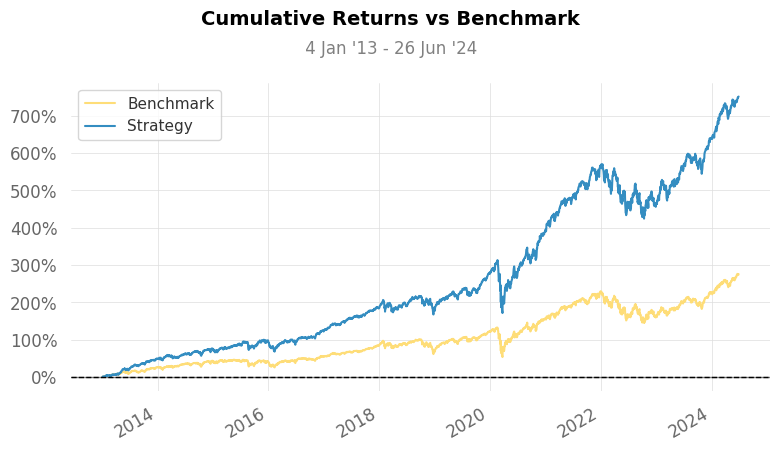

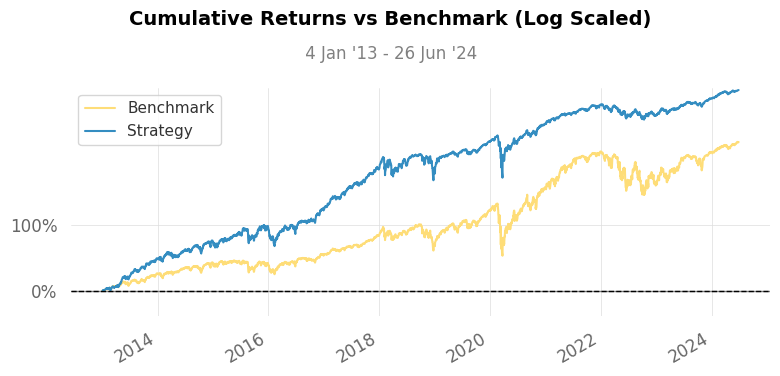

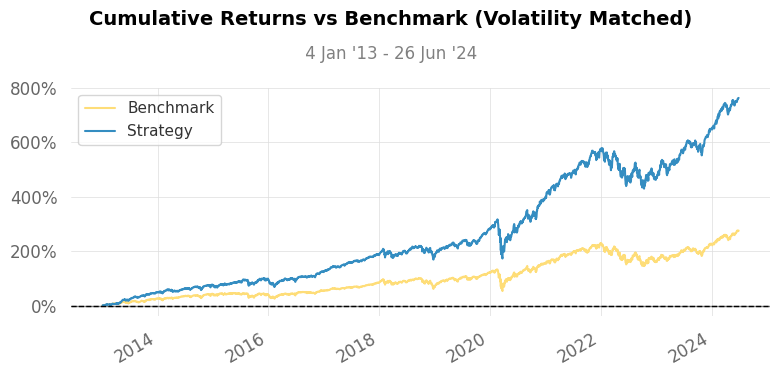

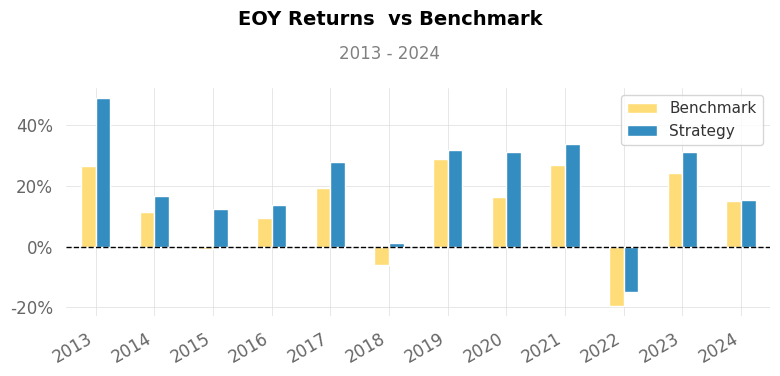

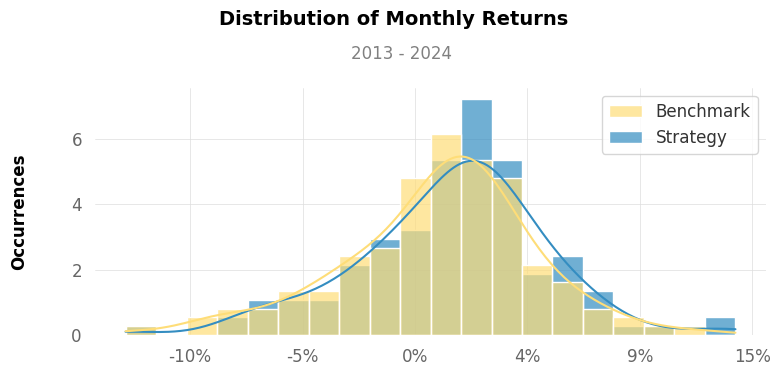

...

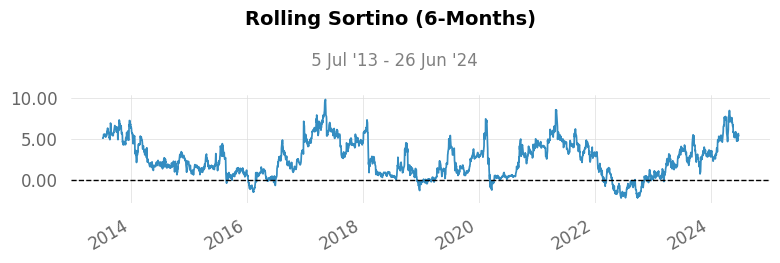

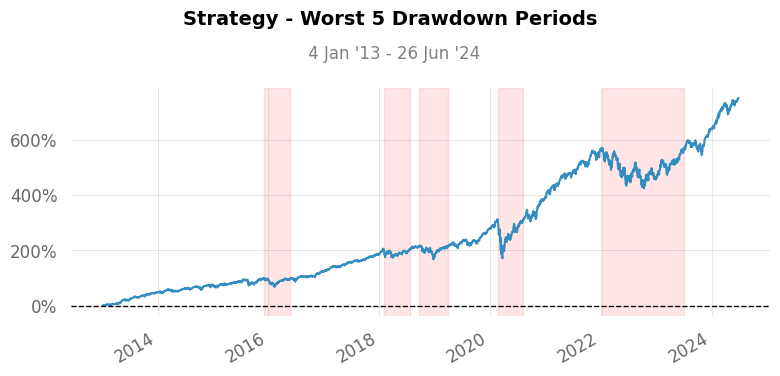

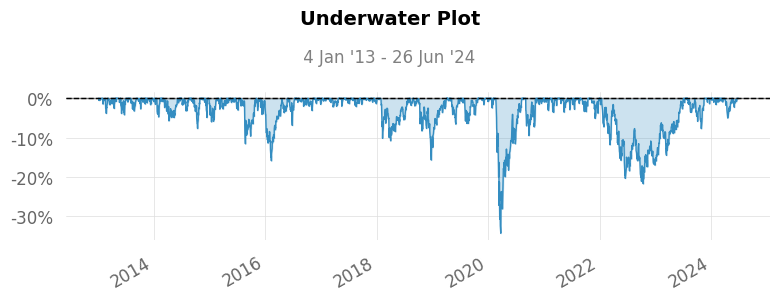

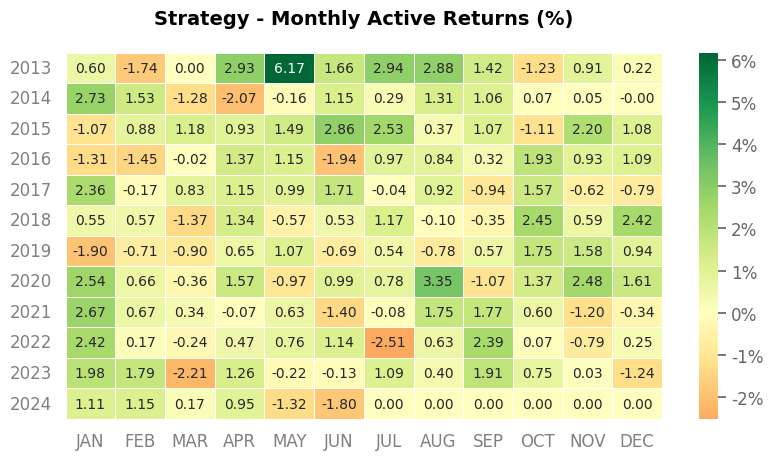

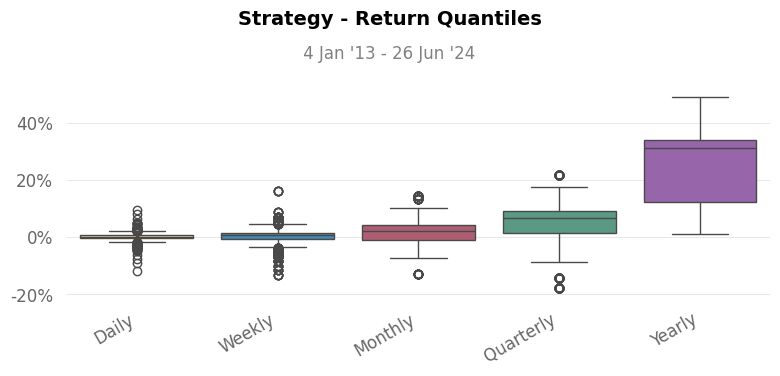

In [ ]:
#Portfolio Metrics with the Annual Risk Free Rate


benchmark_data = yf.download('^GSPC', start=start_date, end=end_date)
benchmark_returns = benchmark_data['Adj Close'].pct_change().dropna()

# Extract the daily returns of the portfolio
portfolio_returns = rb_portfolio.returns()

# Now you can use the full_report method from QSAdapter
portfolio_returns.vbt.returns.qs.full_report(
    benchmark=benchmark_returns,
    rf=0.05,
    grayscale=False,
    figsize=(8, 5),
    display=True,
    compounded=True,
    periods_per_year=252,
    match_dates=False
)



# Forecasting the Portfolio

In [ ]:
#Forecasting data

from datetime import datetime
import yfinance as yf
import pandas as pd
import numpy as np

assets = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'BRK-A', 'BRK-B', 'NVDA', 'UNH', 'V',
          'MA', 'JPM', 'JNJ', 'PG', 'DIS', 'BAC', 'PFE', 'MRK', 'ABBV', 'LLY', 'TMO',
          'MDT', 'ABT', 'ASML', 'CRM', 'META', 'PRU', 'MET', 'CB', 'WFC', 'GS',
          'CI', 'TRV', 'AFL', 'DGX', 'HIG', 'BTC-USD']


start_date = '2013-01-02'
end_date = datetime.today().strftime('%Y-%m-%d')


# Download historical data
forecast_data = yf.download(assets, start=start_date, end=end_date)['Adj Close']

[*********************100%%**********************]  37 of 37 completed


In [ ]:
forecast_data

Ticker,AAPL,ABBV,ABT,AFL,AMZN,ASML,BAC,BRK-A,BRK-B,BTC-USD,CB,CI,CRM,DGX,DIS,GOOGL,GS,HIG,JNJ,JPM,LLY,MA,MDT,MET,META,MRK,MSFT,NVDA,PFE,PG,PRU,TMO,TRV,TSLA,UNH,V,WFC
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-02,16.725037,22.002176,25.748272,20.467270,12.865500,59.565228,9.784617,139610.0,93.199997,NaN,64.427528,51.773003,42.736675,46.352364,46.303741,18.078600,106.419861,18.617508,51.558193,32.691418,38.293221,47.666306,32.405090,21.541845,27.942581,27.599781,22.492279,0.293560,15.956170,49.835758,35.572136,62.445572,55.961868,2.357333,45.698944,35.808285,25.187162
2013-01-03,16.513931,21.820499,26.728386,19.948683,12.924000,58.316467,9.727684,140549.0,93.620003,NaN,64.766273,51.012753,42.122478,46.123196,46.403400,18.089098,105.837875,18.978710,51.485424,32.625542,38.455635,47.734505,32.861607,21.511202,27.713053,28.260723,22.190971,0.293791,15.919221,49.519741,35.337204,62.253441,56.391968,2.318000,43.562309,35.835934,24.978771
2013-01-04,16.053940,21.544844,26.567711,19.698845,12.957500,57.718849,9.849687,140803.0,93.849998,NaN,64.845039,51.388176,42.347183,45.830826,47.291428,18.446547,108.723442,19.253536,52.074959,33.203819,39.878777,47.732632,33.008625,22.032133,28.701021,28.020386,21.775658,0.303484,15.986962,49.620285,35.889641,62.801037,56.883537,2.293333,43.646099,36.128616,25.108124
2013-01-07,15.959508,21.588699,26.784630,19.623144,13.423000,56.782288,9.833418,140190.0,93.449997,NaN,64.057335,51.566521,42.189888,45.664883,46.185944,18.366058,108.521393,19.010124,51.965771,33.240414,39.824623,48.559837,33.395508,21.934074,29.359669,28.120525,21.734938,0.294714,15.999278,49.282722,35.426094,63.290977,56.115479,2.289333,43.646099,36.386723,24.985962
2013-01-08,16.002457,21.118828,26.792667,19.850252,13.319000,56.318462,9.743951,141000.0,93.809998,NaN,63.009659,51.078445,42.437065,45.577969,45.995647,18.329815,107.543373,18.727446,51.973038,33.306305,40.126286,48.399994,33.356812,22.062775,29.000406,28.160587,21.620926,0.288252,16.023912,49.203739,35.343548,62.897106,56.215321,2.245333,43.067947,36.725506,24.942833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64252.578125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-06-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63180.796875,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-06-24,208.139999,172.740005,105.300003,90.430000,185.570007,1002.010010,40.020000,624082.0,413.980011,60277.414062,266.119995,343.140015,239.940002,140.229996,101.980003,179.220001,462.089996,104.419998,149.119995,198.880005,890.109985,456.959991,81.040001,72.120003,498.910004,132.960007,447.670013,118.110001,28.360001,168.449997,119.160004,565.950012,211.089996,182.580002,489.980011,276.299988,59.009998


In [ ]:
# Reshape the data from wide to long format
forecast_data_long = forecast_data.stack().reset_index()
forecast_data_long.columns = ['ds', 'Asset', 'y']

# Format the 'ds' column to datetime
forecast_data_long['ds'] = pd.to_datetime(forecast_data_long['ds'])


from sklearn.model_selection import train_test_split
from prophet import Prophet
from sklearn.metrics import mean_absolute_error

# Split data into training and testing sets for each asset
train_returns = {}
test_returns = {}
for asset in assets:
    asset_data = forecast_data_long[forecast_data_long['Asset'] == asset]
    train, test = train_test_split(asset_data, test_size=0.2, shuffle=False)
    train_returns[asset] = train.rename(columns={'Date': 'ds', 'Price': 'y'})
    test_returns[asset] = test.rename(columns={'Date': 'ds', 'Price': 'y'})

# Create a Prophet model for each asset and make forecasts
models = {}
forecasts = {}
forecast_horizon = 30  # Number of days to forecast
for asset in assets:
    model = Prophet()
    model.fit(train_returns[asset])
    models[asset] = model
    future = model.make_future_dataframe(periods=forecast_horizon)
    forecast = model.predict(future)
    forecasts[asset] = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp5jy4n8_l/ocf54cz8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp5jy4n8_l/owaf_9cq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34479', 'data', 'file=/tmp/tmp5jy4n8_l/ocf54cz8.json', 'init=/tmp/tmp5jy4n8_l/owaf_9cq.json', 'output', 'file=/tmp/tmp5jy4n8_l/prophet_model4rxuoyum/prophet_model-20240627111113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:11:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:11:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp5j

In [ ]:
forecasts

{'AAPL':              ds        yhat  yhat_lower  yhat_upper
 0    2013-01-02   16.473360   10.265704   22.648342
 1    2013-01-03   16.284195   10.471444   22.315385
 2    2013-01-04   16.040273   10.114460   21.794212
 3    2013-01-07   15.764959    9.891590   22.107563
 4    2013-01-08   15.713478    9.361514   22.011123
 ...         ...         ...         ...         ...
 2337 2022-04-03  173.156534  167.089309  179.035992
 2338 2022-04-04  171.798073  165.881313  177.850232
 2339 2022-04-05  172.062678  166.233132  177.845420
 2340 2022-04-06  172.288360  166.171737  178.156272
 2341 2022-04-07  172.405202  166.338262  178.297823
 
 [2342 rows x 4 columns],
 'MSFT':              ds        yhat  yhat_lower  yhat_upper
 0    2013-01-02   24.401689   14.916090   34.002490
 1    2013-01-03   24.041563   14.575620   33.286501
 2    2013-01-04   23.809860   15.090272   33.004303
 3    2013-01-07   22.742174   13.958743   31.948073
 4    2013-01-08   22.455334   13.699109   31.356095
 .

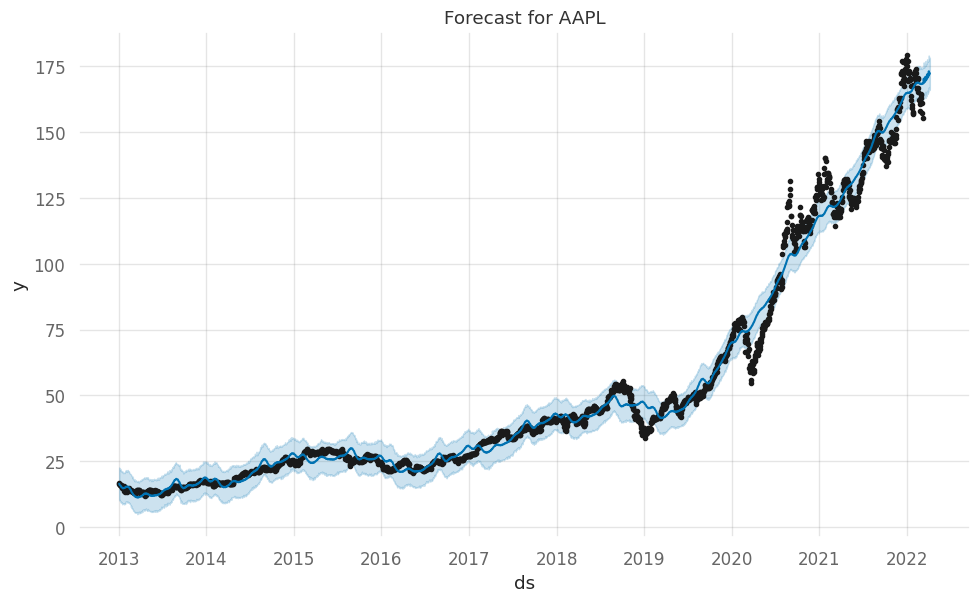

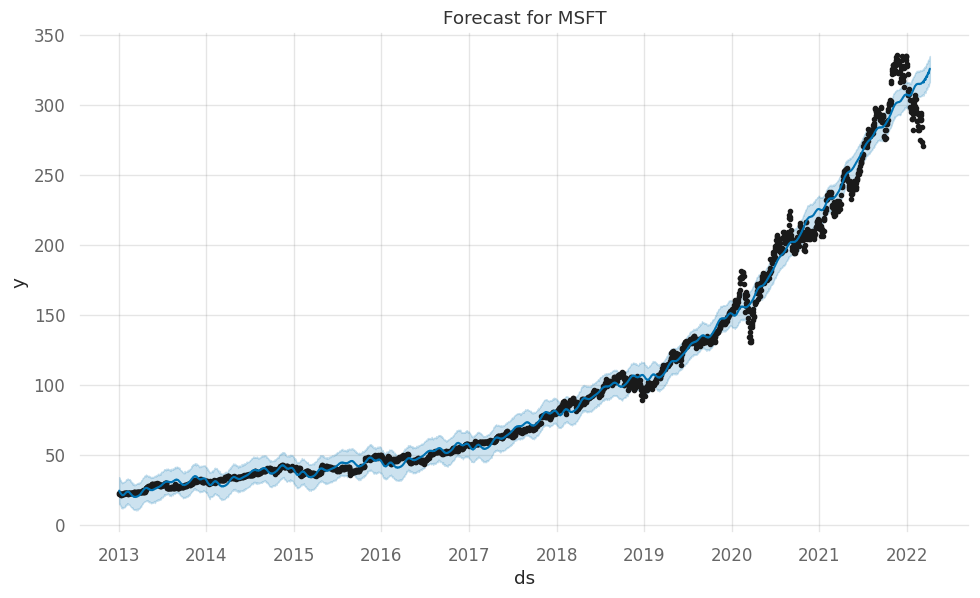

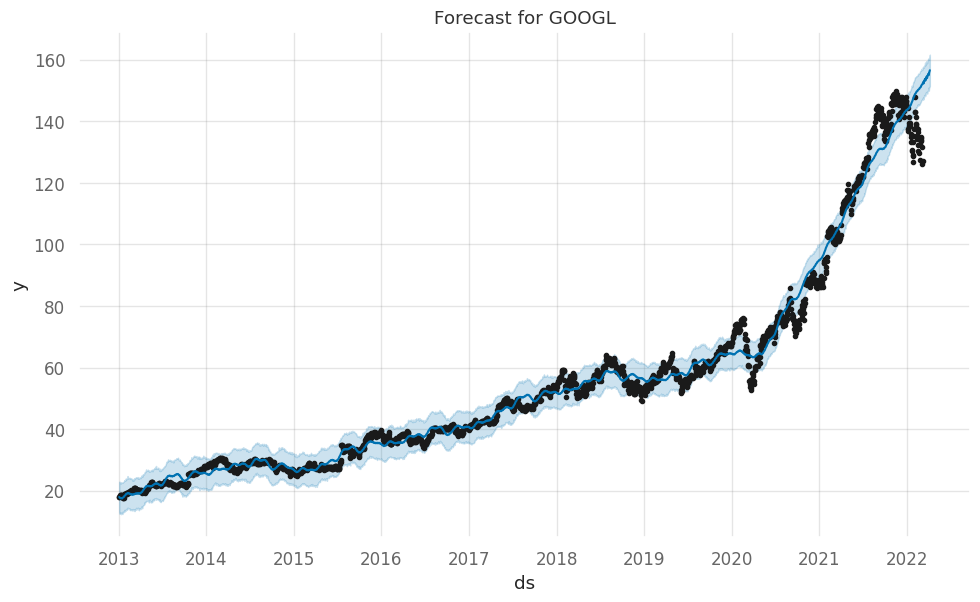

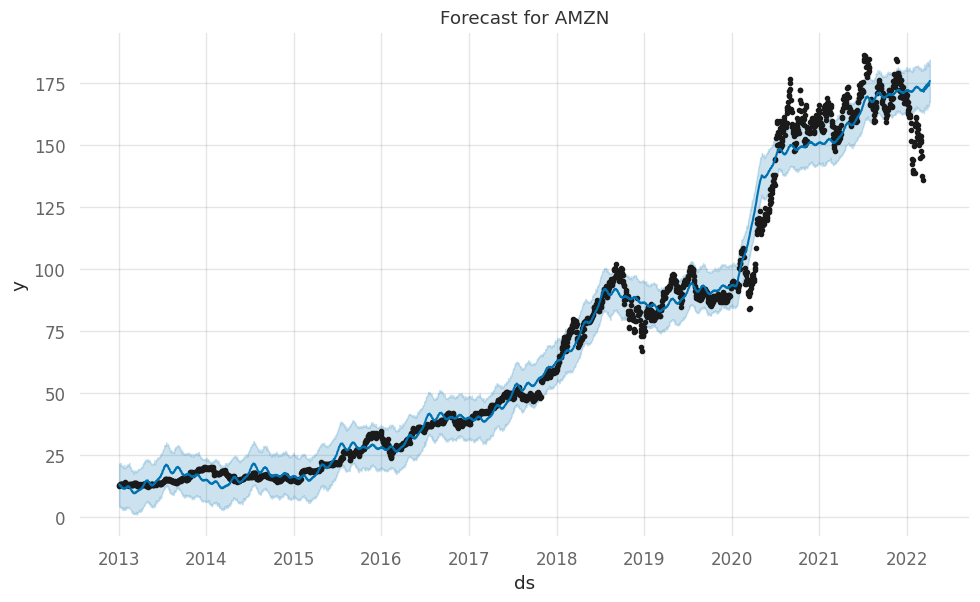

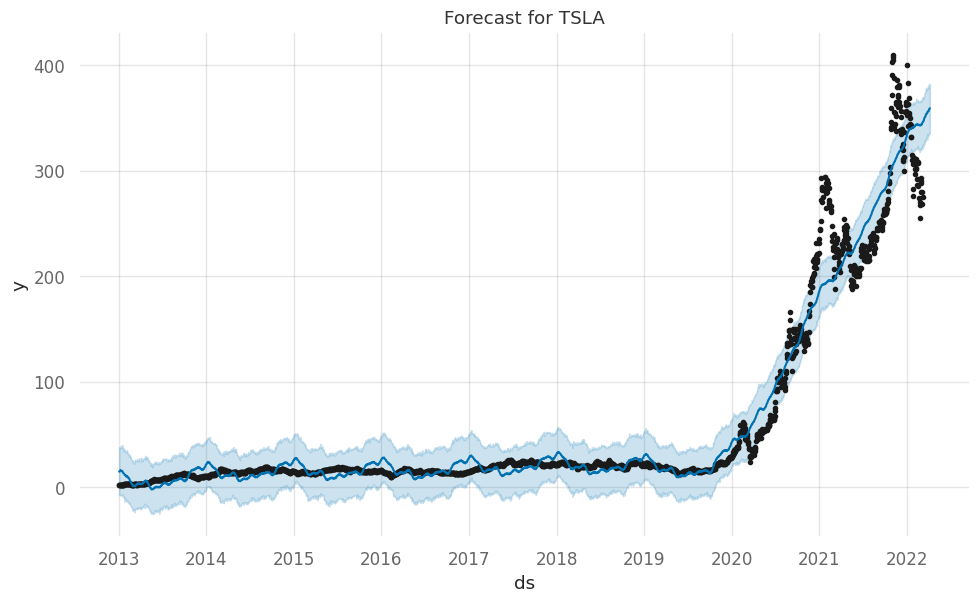

...

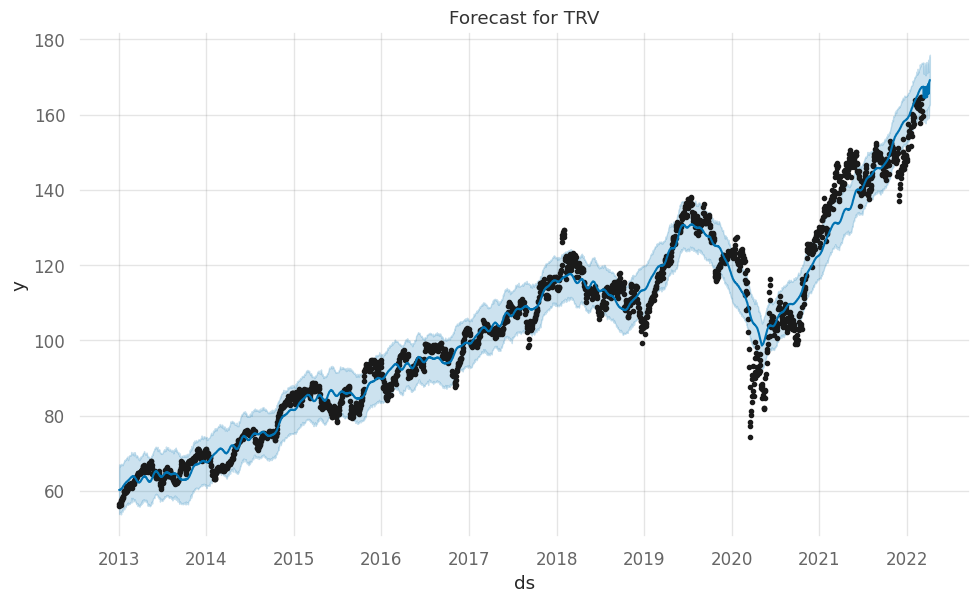

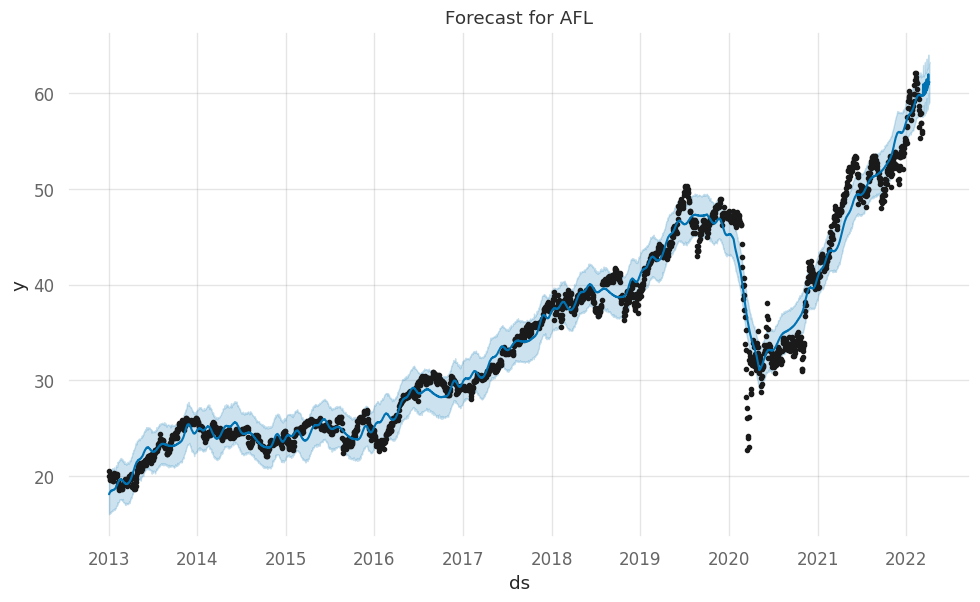

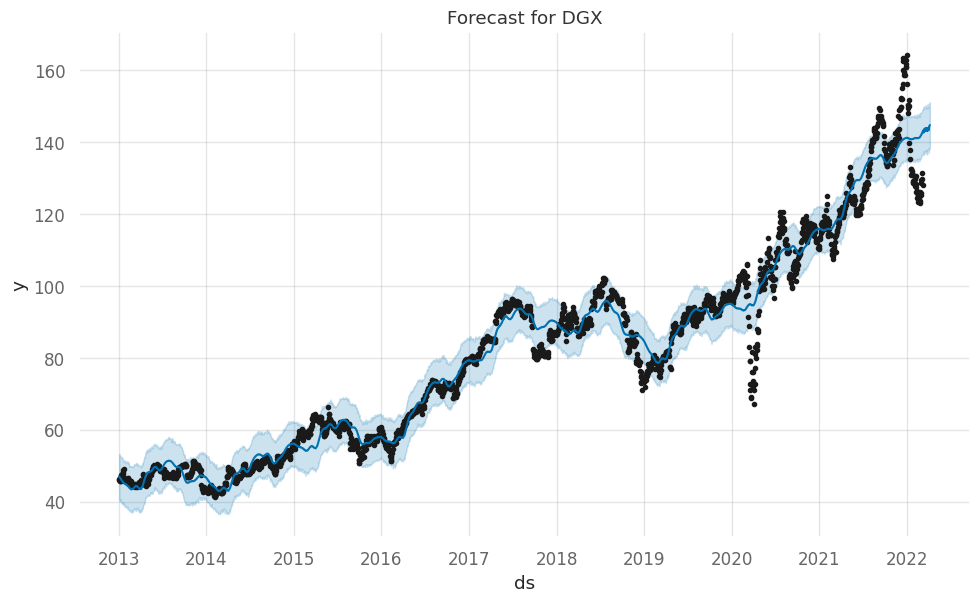

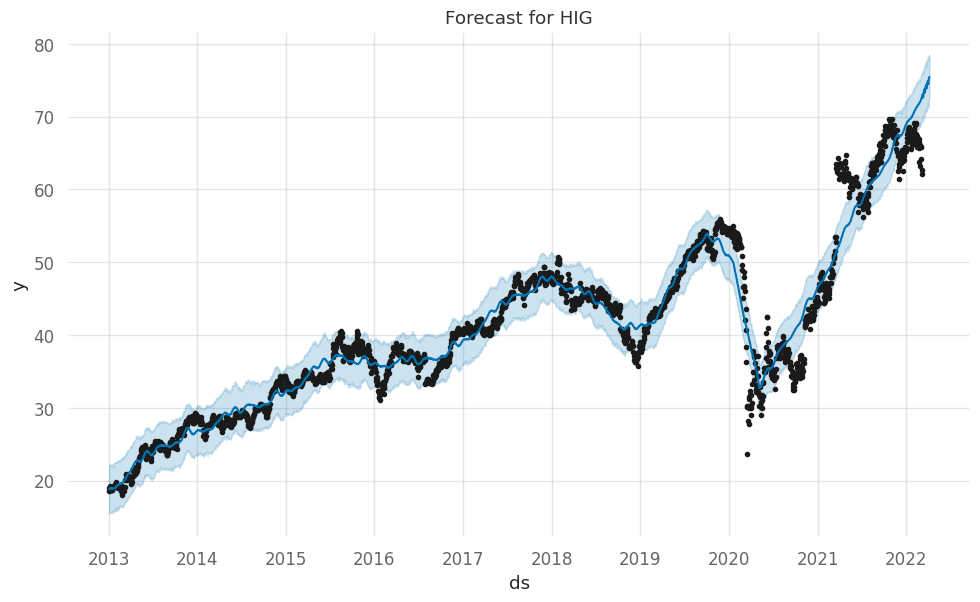

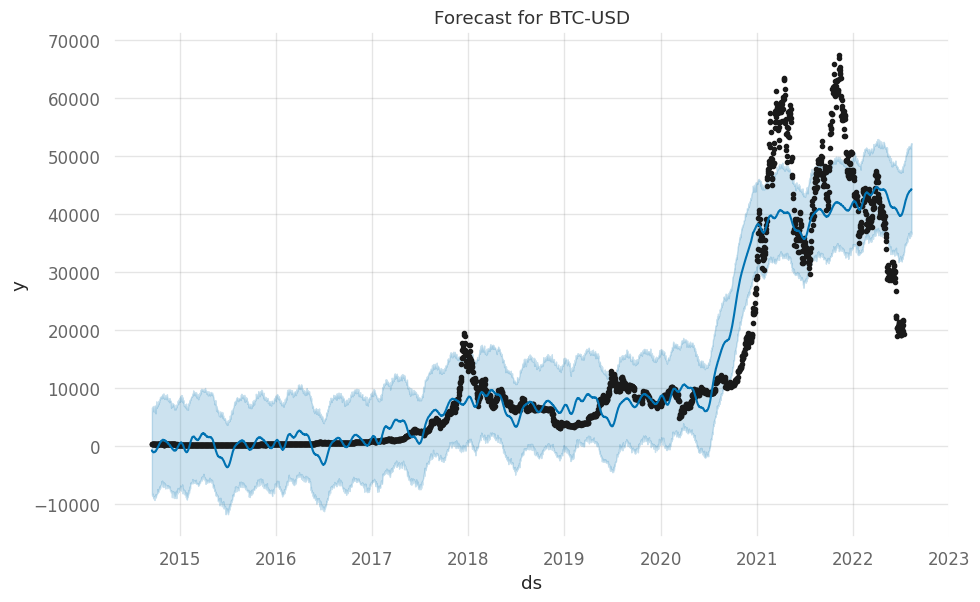

In [ ]:
import matplotlib.pyplot as plt

# Plot the forecast for each asset
for asset, model in models.items():
    fig = model.plot(forecasts[asset])
    plt.title(f'Forecast for {asset}')
    plt.show()

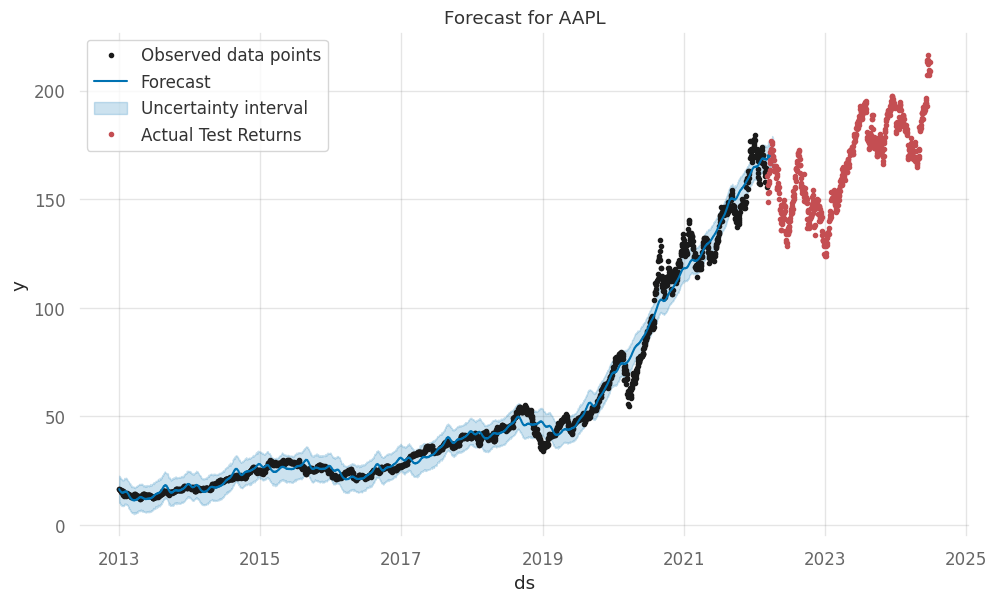

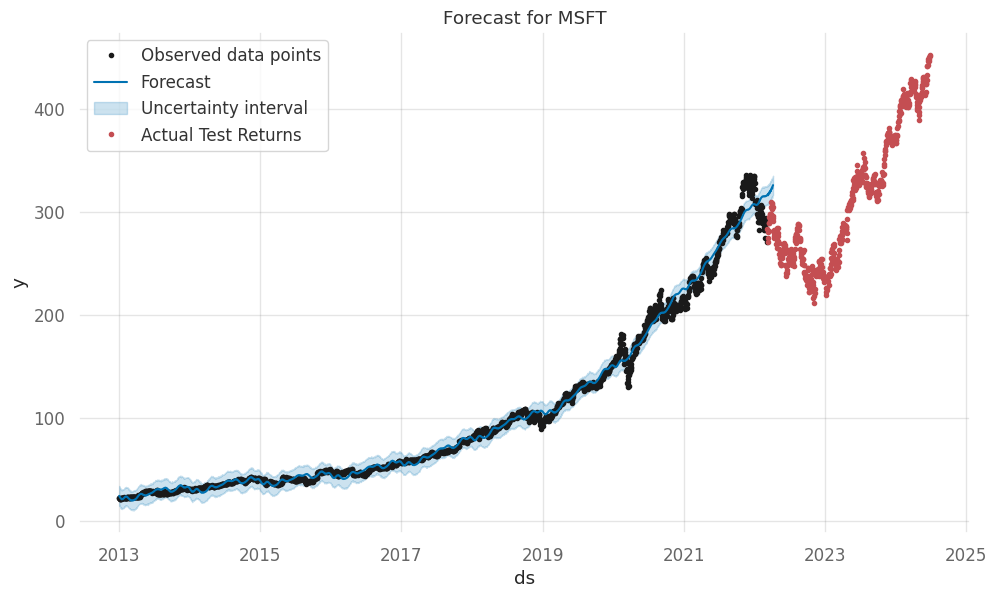

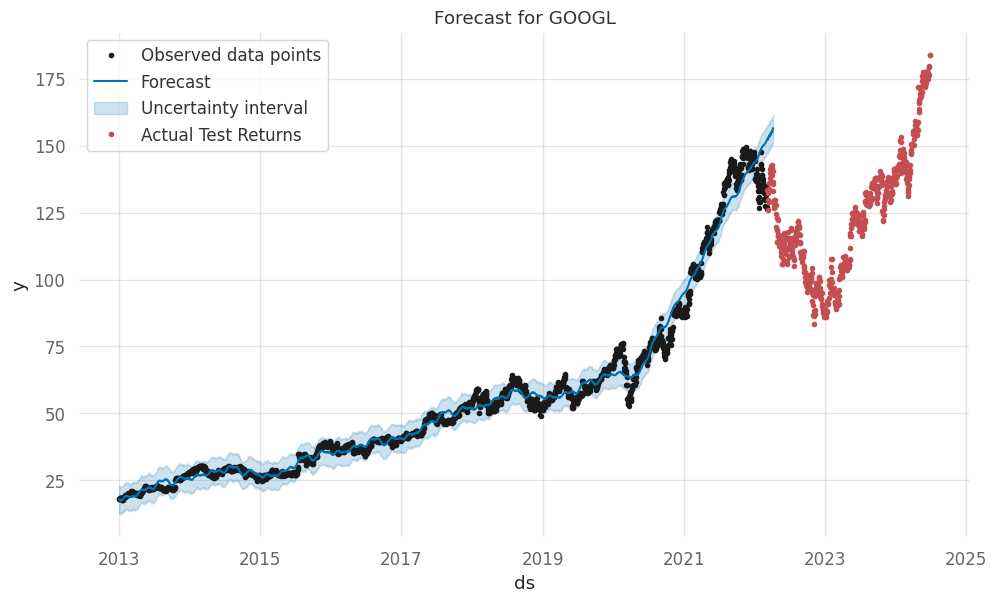

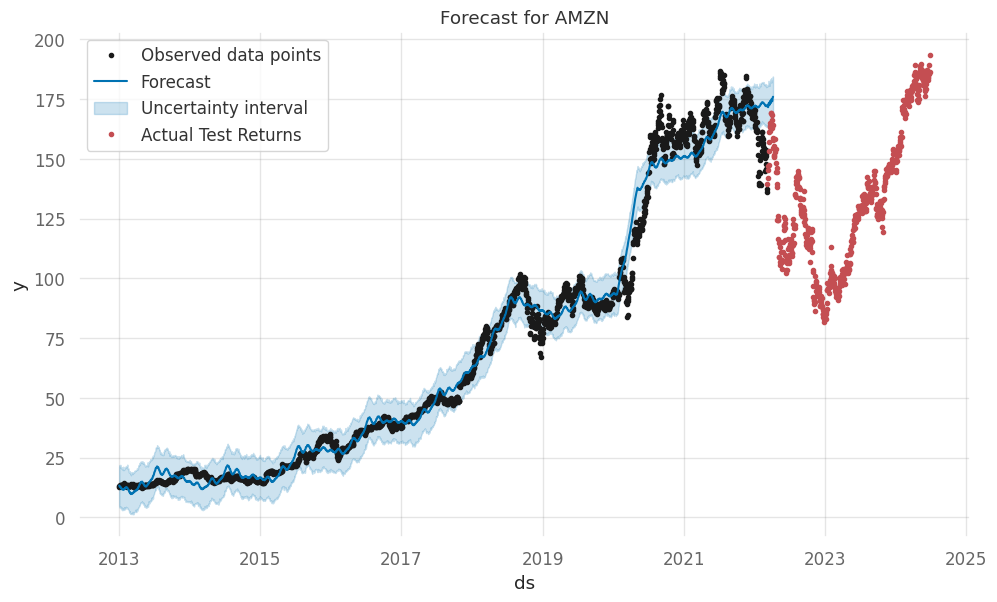

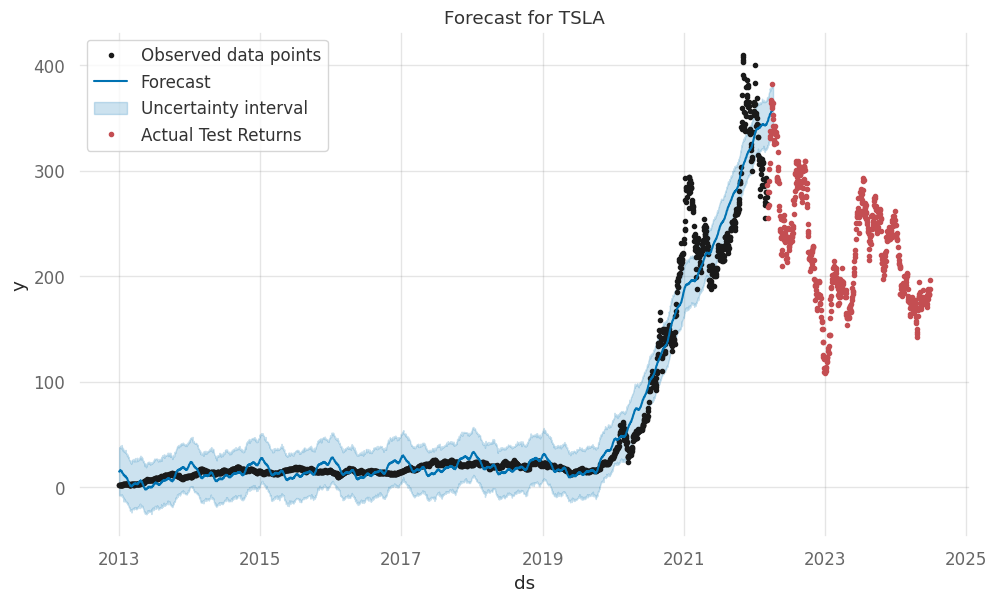

...

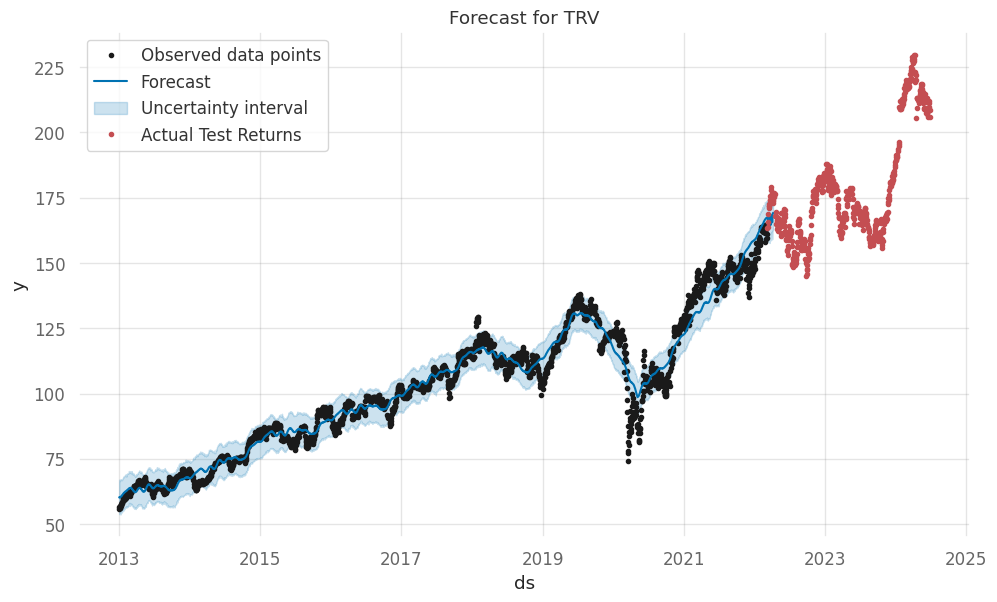

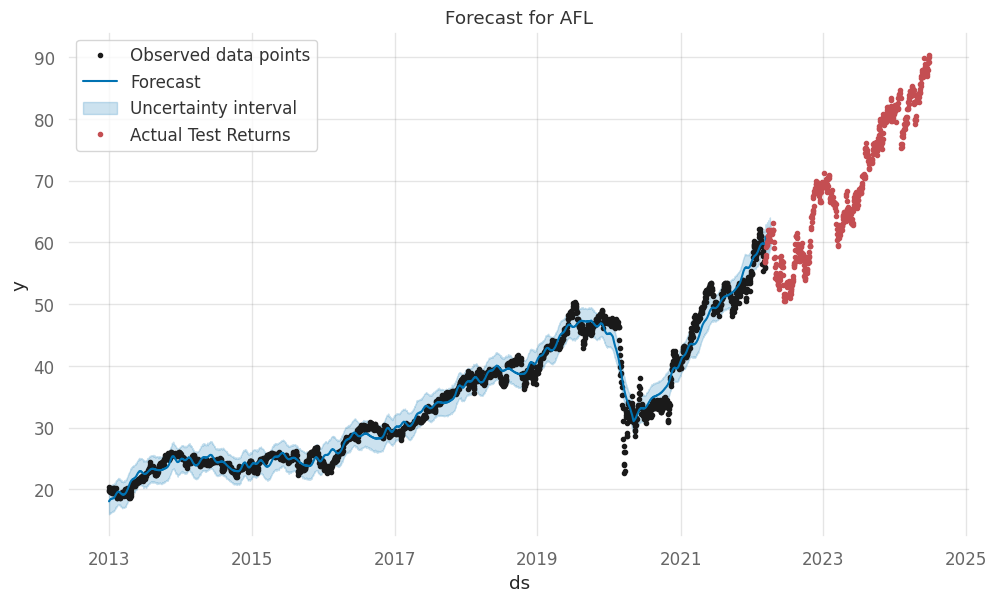

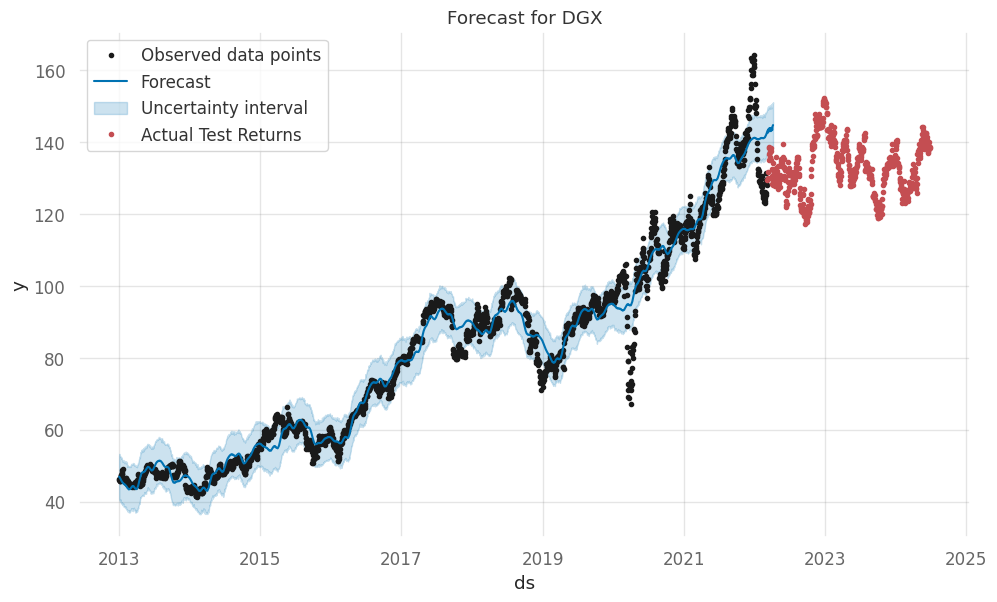

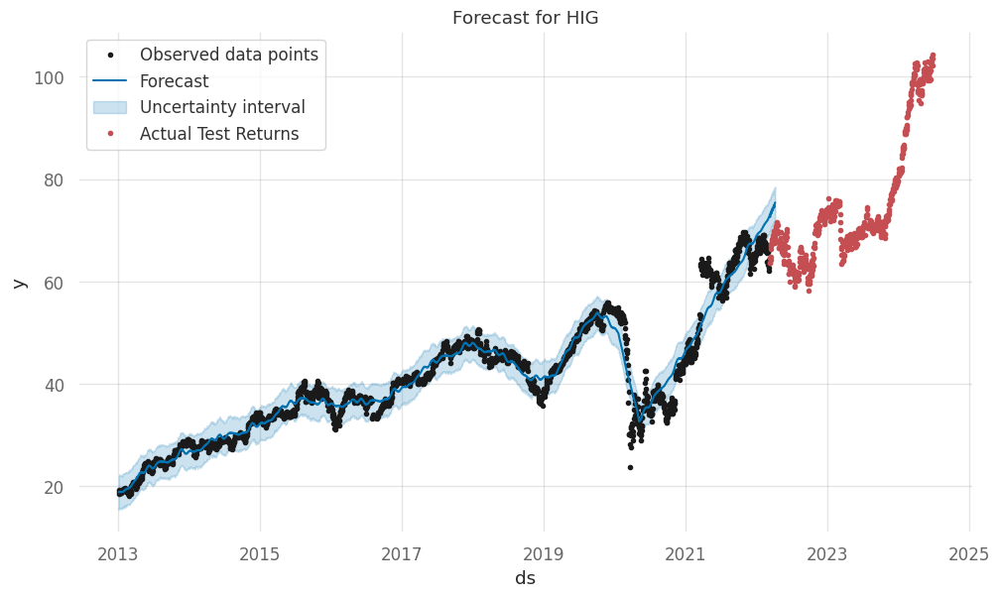

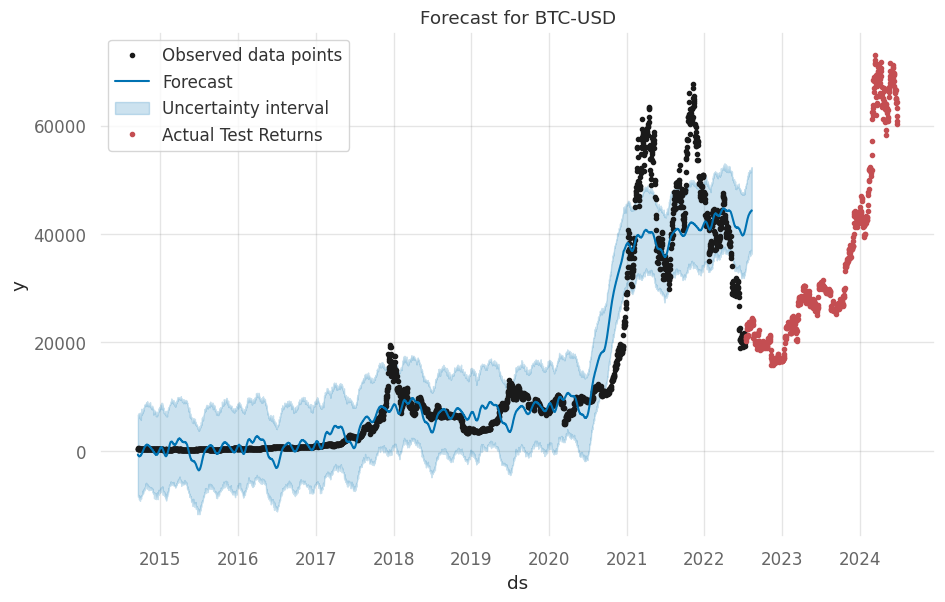

In [ ]:
import matplotlib.pyplot as plt

# Plot the forecast and actual test returns for each asset
for asset, model in models.items():
    # Plot forecast
    fig = model.plot(forecasts[asset])
    plt.title(f'Forecast for {asset}')

    # Plot actual test returns
    test_data = test_returns[asset]
    plt.plot(test_data['ds'], test_data['y'], 'r.', label='Actual Test Returns')

    # Add legend
    plt.legend()

    # Show plot
    plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Define a function to calculate RMSE
def root_mean_squared_error(actual, predicted):
    return np.sqrt(mean_squared_error(actual, predicted))

# Define a function to calculate MAPE
def mean_absolute_percentage_error(actual, predicted):
    mask = actual != 0
    actual = actual.reset_index(drop=True)
    predicted = predicted.reset_index(drop=True)
    return np.mean(np.abs((actual - predicted) / actual)[mask]) * 100 if mask.any() else 0.0

# Define a function to calculate SMAPE
def symmetric_mean_absolute_percentage_error(actual, predicted):
    mask = (actual + predicted) != 0
    actual = actual.reset_index(drop=True)
    predicted = predicted.reset_index(drop=True)
    return 200 * np.mean(np.abs(actual - predicted) / (np.abs(actual) + np.abs(predicted))[mask]) if mask.any() else 0.0

# Define a function to calculate MASE
def mean_absolute_scaled_error(actual, predicted, naive_forecast):
    return mean_absolute_error(actual, predicted) / mean_absolute_error(actual, naive_forecast)

# Evaluate the performance for each asset
for asset in assets:
    # Extract the predicted 'yhat' and the actual values from the test set
    predicted = forecasts[asset]['yhat'].iloc[-len(test_returns[asset]):]
    actual = test_returns[asset]['y'].reset_index(drop=True)

    # Calculate additional performance metrics
    mse = mean_squared_error(actual, predicted)
    rmse = root_mean_squared_error(actual, predicted)
    mae = mean_absolute_error(actual, predicted)
    mape = mean_absolute_percentage_error(actual, predicted)
    smape = symmetric_mean_absolute_percentage_error(actual, predicted)

    # For MASE, you need a benchmark forecast (e.g., simple moving average)
    naive_forecast = actual.shift(1).fillna(method='bfill')
    mase = mean_absolute_scaled_error(actual, predicted, naive_forecast)

    # Print the performance metrics for the current asset
    print(f"Performance metrics for {asset}:")
    print(f"MSE: {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAE: {mae:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"SMAPE: {smape:.2f}%")
    print(f"MASE: {mase:.2f}")
    print()



Performance metrics for AAPL:
MSE: 2416.74
RMSE: 49.16
MAE: 43.83
MAPE: 26.84%
SMAPE: 32.61%
MASE: 20.89

Performance metrics for MSFT:
MSE: 6792.37
RMSE: 82.42
MAE: 75.87
MAPE: 23.96%
SMAPE: 27.95%
MASE: 19.22

Performance metrics for GOOGL:
MSE: 758.53
RMSE: 27.54
MAE: 19.34
MAPE: 15.99%
SMAPE: 19.24%
MASE: 10.52

Performance metrics for AMZN:
MSE: 1261.15
RMSE: 35.51
MAE: 29.88
MAPE: 25.92%
SMAPE: 22.53%
MASE: 13.37

Performance metrics for TSLA:
MSE: 17672.62
RMSE: 132.94
MAE: 102.99
MAPE: 45.39%
SMAPE: 51.91%
MASE: 17.23

Performance metrics for BRK-A:
MSE: 18874834871.80
RMSE: 137385.72
MAE: 135223.02
MAPE: 26.86%
SMAPE: 31.27%
MASE: 32.22

Performance metrics for BRK-B:
MSE: 8028.91
RMSE: 89.60
MAE: 87.95
MAPE: 26.41%
SMAPE: 30.68%
MASE: 33.03

Performance metrics for NVDA:
MSE: 1085.68
RMSE: 32.95
MAE: 24.09
MAPE: 52.30%
SMAPE: 74.48%
MASE: 24.97

Performance metrics for UNH:
MSE: 26303.77
RMSE: 162.18
MAE: 145.07
MAPE: 29.08%
SMAPE: 35.67%
MASE: 28.45

Performance metrics for 